# Task 3 - Ball Detection

**Goal:** detect the *position* of the balls on the pool table
(bounding boxes, single class `Ball`). We train and **compare two detectors**:

| Model | Family | Why |
|-------|--------|-----|
| **YOLO11** (`yolo11s`) | CNN (One-stage, Anchor-free) | State-of-the-art baseline, extremely fast inference, and highly robust documentation. |
| **RT-DETR** (`rtdetr-l`) | Vision Transformer (DETR family) | End-to-end architecture (no NMS required). Using the Ultralytics implementation avoids standard DETR's complex COCO JSON format, seamlessly sharing the exact same YOLO `data.yaml` pipeline. |

Both are trained from the **same dataset** (`data.yaml`, `nc=1`, `names=['Ball']`) and
evaluated on the **same `test` split** with the **same metrics**, so the comparison is fair.

Detection uses the third-party [`ultralytics`](https://github.com/ultralytics/ultralytics) package (YOLO and RT-DETR).


## 0. Environment & imports


In [3]:
import os

# --- ROCm / AMD GPU compatibility (same overrides used in task2.py) ---
# Harmless on NVIDIA/CPU. Remove if you are on CUDA and they cause issues.
os.environ.setdefault("HSA_OVERRIDE_GFX_VERSION", "10.3.0")
os.environ.setdefault("HSA_ENABLE_SDMA", "0")

# !pip install ultralytics  # uncomment on first run if needed

import json, glob, random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch

# --- ROCm fix ---
# Several internal PyTorch ROCm entry points (device selection, manual_seed_all,
# lazy init...) call GPU-counting helpers that reference the optional `amdsmi`
# python bindings; when amdsmi is not installed this raises
# `NameError: name 'amdsmi' is not defined`. We replace the low-level helpers so
# every caller falls back to the device count that works fine on HIP/ROCm.
if getattr(torch.version, "hip", None):
    import torch.cuda as _tcuda
    def _safe_device_count():
        try:
            return torch._C._cuda_getDeviceCount()
        except Exception:
            return 0
    _tcuda._raw_device_count_amdsmi = _safe_device_count
    _tcuda._device_count_amdsmi = _safe_device_count
    _tcuda.device_count = _safe_device_count
    print("ROCm device_count patched ->", torch.cuda.device_count())

from ultralytics import YOLO, RTDETR

print("torch:", torch.__version__, "| CUDA/ROCm available:", torch.cuda.is_available())

torch: 2.12.0+cpu | CUDA/ROCm available: False


## 1. Configuration


In [4]:
SEED      = 42
DATASET_DIR = "dataset"                 # folder containing data.yaml + train/valid/test
DATA_YAML   = os.path.join(DATASET_DIR, "data.yaml")

YOLO_MODEL  = "yolo11s.pt"
RTDETR_MODEL = "rtdetr-l.pt"

EPOCHS   = 100                          # upper bound; early stopping (patience) usually stops earlier
PATIENCE = 20                           # epochs without val improvement before stopping
IMG_SIZE = 640                          # shared by both models -> fair comparison + fits 8 GB VRAM
YOLO_BATCH   = 8                        # yolo11s is light;
RTDETR_BATCH = 2                        # RT-DETR-l is heavy;
WORKERS  = 4                            # dataloader workers; lower = less RAM (no effect on accuracy)
DEVICE   = 0 if torch.cuda.is_available() else "cpu"

OUT_DIR  = "task3_runs"                 # all training runs + figures land here
FIG_DIR  = os.path.join(OUT_DIR, "figures")
os.makedirs(FIG_DIR, exist_ok=True)

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
print("device:", DEVICE)

device: cpu


## 2. Resolve dataset paths

Dynamically rewrite `data.yaml` with absolute paths to prevent Ultralytics' common **"dataset not found"** resolution errors.

In [5]:
import yaml

with open(DATA_YAML) as f:
    cfg = yaml.safe_load(f)

cfg["path"]  = os.path.abspath(DATASET_DIR)
cfg["train"] = "train/images"
cfg["val"]   = "valid/images"
cfg["test"]  = "test/images"
cfg.setdefault("nc", 1)
cfg.setdefault("names", ["Ball"])

RESOLVED_YAML = os.path.abspath(os.path.join(OUT_DIR, "data_resolved.yaml"))
with open(RESOLVED_YAML, "w") as f:
    yaml.safe_dump(cfg, f, sort_keys=False)

print("Using:", RESOLVED_YAML)
print(json.dumps(cfg, indent=2))

Using: c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\task3_runs\data_resolved.yaml
{
  "train": "train/images",
  "val": "valid/images",
  "test": "test/images",
  "nc": 1,
  "names": [
    "Ball"
  ],
  "path": "c:\\Users\\MiguelGuerrinha\\FEUP\\VC\\Proj_Task3\\dataset"
}


## 3. Dataset exploration

Computes dataset statistics (images per split and balls per image) to validate data distribution for the final report.

       n_images  total_balls  balls_per_img_mean
train    1560.0      14198.0            9.101282
valid     195.0       1701.0            8.723077
test      196.0       1725.0            8.801020


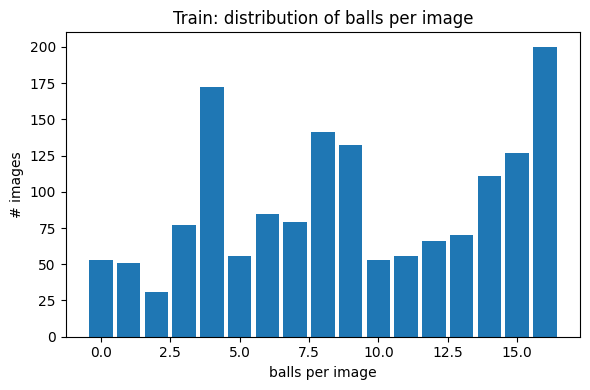

In [6]:
def split_dir(split):
    return os.path.join(DATASET_DIR, split, "images"), os.path.join(DATASET_DIR, split, "labels")

def count_boxes(label_path):
    if not os.path.exists(label_path):
        return 0
    with open(label_path) as f:
        return sum(1 for line in f if len(line.split()) >= 5)

stats = {}
for split in ["train", "valid", "test"]:
    img_dir, lbl_dir = split_dir(split)
    imgs = sorted(glob.glob(os.path.join(img_dir, "*.*")))
    counts = [count_boxes(os.path.join(lbl_dir, os.path.splitext(os.path.basename(p))[0] + ".txt")) for p in imgs]
    stats[split] = {"n_images": len(imgs), "total_balls": int(np.sum(counts)),
                    "balls_per_img_mean": float(np.mean(counts)) if counts else 0.0, "counts": counts}

print(pd.DataFrame({k: {kk: vv for kk, vv in v.items() if kk != "counts"} for k, v in stats.items()}).T)

plt.figure(figsize=(6, 4))
train_counts = stats["train"]["counts"]
plt.hist(train_counts, bins=range(0, (max(train_counts) if train_counts else 1) + 2), align="left", rwidth=0.85)
plt.xlabel("balls per image"); plt.ylabel("# images"); plt.title("Train: distribution of balls per image")
plt.tight_layout(); plt.savefig(os.path.join(FIG_DIR, "ball_count_distribution.png"), dpi=120); plt.show()

Few **training images with their ground-truth boxes** (read directly from the YOLO `.txt` labels and de-normalised to pixel coordinates).

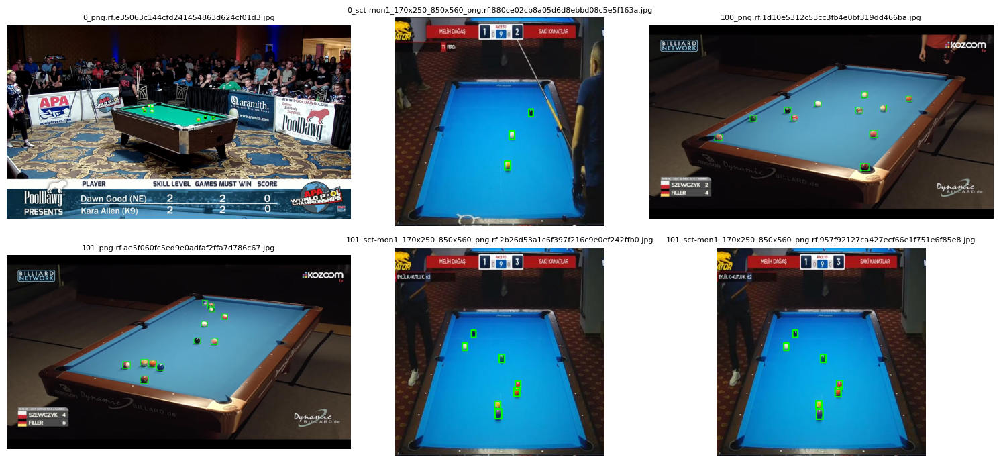

In [5]:
def draw_gt(img_path, lbl_path):
    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    if os.path.exists(lbl_path):
        for line in open(lbl_path):
            p = line.split()
            if len(p) < 5:
                continue
            cx, cy, bw, bh = map(float, p[1:5])
            x1, y1 = int((cx - bw / 2) * w), int((cy - bh / 2) * h)
            x2, y2 = int((cx + bw / 2) * w), int((cy + bh / 2) * h)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return img

img_dir, lbl_dir = split_dir("train")
sample = sorted(glob.glob(os.path.join(img_dir, "*.*")))[:6]
fig, axes = plt.subplots(2, 3, figsize=(15, 7))
for ax, p in zip(axes.ravel(), sample):
    lbl = os.path.join(lbl_dir, os.path.splitext(os.path.basename(p))[0] + ".txt")
    ax.imshow(draw_gt(p, lbl)); ax.set_title(os.path.basename(p), fontsize=8); ax.axis("off")
plt.tight_layout(); plt.savefig(os.path.join(FIG_DIR, "gt_samples.png"), dpi=120); plt.show()

## 4. Train Model 1 - YOLO11

Utilizes the Ultralytics framework to automatically manage data augmentation, training loops, early stopping (`patience`), and checkpoint logging.


In [ ]:
yolo = YOLO(YOLO_MODEL)
yolo_train = yolo.train(
    data=RESOLVED_YAML, epochs=EPOCHS, patience=PATIENCE, imgsz=IMG_SIZE,
    batch=YOLO_BATCH, device=DEVICE, seed=SEED, project=OUT_DIR, name="yolo",
    workers=WORKERS, exist_ok=True, verbose=True,
)
YOLO_RUN = str(yolo.trainer.save_dir)
print("YOLO run dir:", YOLO_RUN)
print("Best weights:", os.path.join(YOLO_RUN, "weights", "best.pt"))

New https://pypi.org/project/ultralytics/8.4.68 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.67 🚀 Python-3.10.12 torch-2.4.1+rocm6.0 CUDA:0 (AMD Radeon RX 6600, 8176MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/rui/Documentos/VC/Proj_Task3/task3_runs/data_resolved.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0

### Evaluate YOLO11 on the test split

In [7]:
def extract_metrics(val_result, torch_module):
    b = val_result.box
    n_params = sum(p.numel() for p in torch_module.parameters())
    inf_ms = float(val_result.speed.get("inference", float("nan")))  # ms / image
    return {
        "mAP50-95": float(b.map), "mAP50": float(b.map50), "mAP75": float(b.map75),
        "precision": float(b.mp), "recall": float(b.mr),
        "params(M)": n_params / 1e6,
        "infer_ms": inf_ms, "img/s": (1000.0 / inf_ms) if inf_ms == inf_ms and inf_ms > 0 else float("nan"),
    }

yolo_best = YOLO(os.path.join(YOLO_RUN, "weights", "best.pt"))
yolo_test = yolo_best.val(data=RESOLVED_YAML, split="test", imgsz=IMG_SIZE, batch=YOLO_BATCH,
                          device=DEVICE, project=OUT_DIR, name="yolo_test", exist_ok=True)
YOLO_TEST_DIR = str(yolo_test.save_dir)
yolo_metrics = extract_metrics(yolo_test, yolo_best.model)
print(json.dumps(yolo_metrics, indent=2))

Ultralytics 8.4.67 🚀 Python-3.10.12 torch-2.4.1+rocm6.0 CUDA:0 (AMD Radeon RX 6600, 8176MiB)
YOLO11s summary (fused): 101 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 116.2±62.2 MB/s, size: 56.7 KB)
val: Scanning /home/rui/Documentos/VC/Proj_Task3/dataset/test/labels... 196 images, 3 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 196/196 2.2Kit/s 0.1s
val: New cache created: /home/rui/Documentos/VC/Proj_Task3/dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 25/25 3.8it/s 6.7s<0.2s
                   all        196       1725      0.997      0.993      0.994      0.812
Speed: 1.0ms preprocess, 29.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /home/rui/Documentos/VC/Proj_Task3/runs/detect/task3_runs/yolo_test
{
  "mAP50-95": 0.8121882178559197,
  "mAP50": 0.994193076767418,
  "mAP75": 0.9716669741428599,
  "precision": 0.996

## 5. Train Model 2 - RT-DETR

Replicates the exact training pipeline using the RT-DETR vision transformer, which leverages object queries 
for end-to-end detection without Non-Maximum Suppression (NMS).

In [ ]:
import gc
# Free the VRAM held by the YOLO training objects so RT-DETR starts clean.
# We keep `yolo_best` for the qualitative section later.
for _v in ["yolo", "yolo_train"]:
    if _v in globals():
        del globals()[_v]
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

rtdetr = RTDETR(RTDETR_MODEL)
rtdetr_train = rtdetr.train(
    data=RESOLVED_YAML, epochs=EPOCHS, patience=PATIENCE, imgsz=IMG_SIZE,
    batch=RTDETR_BATCH, device=DEVICE, seed=SEED, project=OUT_DIR, name="rtdetr",
    workers=WORKERS, exist_ok=True, verbose=True,
)
RTDETR_RUN = str(rtdetr.trainer.save_dir)
print("RT-DETR run dir:", RTDETR_RUN)
print("Best weights:", os.path.join(RTDETR_RUN, "weights", "best.pt"))

New https://pypi.org/project/ultralytics/8.4.68 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.4.67 🚀 Python-3.10.12 torch-2.4.1+rocm6.0 CUDA:0 (AMD Radeon RX 6600, 8176MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=2, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/rui/Documentos/VC/Proj_Task3/task3_runs/data_resolved.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtdetr-l.pt, momentum=

/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      1/100      5.85G     0.7165     0.3961     0.2223         66       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:510.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 5.5it/s 8.9s0.1s
                   all        195       1701      0.959      0.943      0.954      0.655

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      2/100      5.92G     0.3728     0.3776    0.03861         56       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:450.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.958      0.945      0.959      0.678

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      3/100       5.9G     0.3472     0.3698    0.02596         18       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.949      0.939      0.946      0.579

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      4/100      5.92G     0.3675     0.3846    0.02289         43       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.952      0.954       0.94      0.487

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      5/100      5.98G      0.338     0.3675    0.01826         42       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.953      0.947      0.943      0.428

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      6/100      5.97G     0.3159     0.3588    0.01836         62       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701       0.96      0.946      0.948      0.437

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      7/100      5.94G     0.3291     0.3652    0.01698         67       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 6.0s0.1s
                   all        195       1701      0.951      0.974      0.957      0.594

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      8/100      6.01G     0.3097     0.3603    0.01683         92       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.946      0.974      0.961      0.631

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      9/100      5.92G     0.2962     0.3488    0.01507         75       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.962      0.967       0.96       0.65

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     10/100      5.92G     0.2855      0.349    0.01583         71       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.961      0.979       0.97      0.697

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     11/100      5.92G     0.2796     0.3359    0.01606         47       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.959      0.965      0.955      0.605

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     12/100      5.95G      0.279     0.3405    0.01516         41       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.968      0.977      0.972      0.648

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     13/100      5.93G     0.2858     0.3418      0.015         65       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.959      0.977      0.965      0.652

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     14/100      5.95G      0.295     0.3516    0.01474         59       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.967       0.98      0.968       0.67

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     15/100      6.03G     0.2585     0.3274    0.01275         37       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.966      0.978      0.967       0.65

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     16/100      5.92G     0.2813     0.3395    0.01381         90       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.966      0.972      0.959      0.676

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     17/100      6.02G     0.2753     0.3381    0.01339         18       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.957      0.975      0.963      0.665

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     18/100      6.05G      0.268      0.333    0.01212         71       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.974      0.981      0.974      0.735

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     19/100      5.93G     0.2622     0.3277    0.01223         35       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.974      0.982      0.979      0.714

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     20/100      6.05G     0.2663     0.3326    0.01279         60       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.972      0.982      0.981      0.713

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     21/100      6.02G     0.2625     0.3297    0.01364         36       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.975      0.977      0.973      0.734

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     22/100      6.03G     0.2687     0.3355    0.01292         79       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701       0.97      0.984      0.974      0.744

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     23/100      5.92G     0.2955     0.3429    0.01357         37       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.973      0.978      0.975      0.709

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     24/100      5.95G     0.2688     0.3347    0.01256         51       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.972      0.978      0.972      0.699

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     25/100      5.94G     0.2462     0.3136    0.01097         50       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.972      0.984      0.977      0.704

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     26/100      6.05G     0.2407     0.3126    0.01143         60       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.977      0.982      0.982      0.751

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     27/100      5.94G     0.2393     0.3116     0.0116         71       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.975      0.985      0.984      0.741

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     28/100      6.06G     0.2381     0.3117    0.01108         75       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701       0.97      0.981      0.977      0.751

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     29/100      5.92G     0.2512     0.3199    0.01255         26       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.972      0.984      0.974       0.74

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     30/100      5.95G     0.2561     0.3226    0.01242         75       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.975      0.982      0.982      0.783

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     31/100      5.91G     0.2268     0.3015     0.0106         67       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.976      0.982      0.979      0.772

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     32/100      6.04G     0.2207     0.3006    0.01146         51       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.973      0.985      0.975      0.767

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     33/100      6.01G     0.2325       0.31    0.01137         24       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.975      0.985      0.983      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     34/100      5.93G     0.2191      0.297    0.01033         73       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.976      0.984      0.978      0.775

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     35/100      5.94G     0.2225     0.3013    0.01087         61       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.974      0.979      0.983      0.783

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     36/100      5.91G     0.2217     0.2963     0.0101         40       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.972      0.986      0.986      0.789

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     37/100      6.03G     0.2222      0.298   0.009844         57       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.981      0.982      0.979      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     38/100      5.93G     0.2306     0.3048    0.01001         64       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.972      0.976      0.979      0.763

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     39/100      5.92G     0.2294     0.3025    0.01045         46       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.974      0.978      0.985      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     40/100      5.94G     0.2167     0.2965    0.01033         57       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.963      0.977      0.983      0.792

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     41/100      5.93G     0.2122     0.2916   0.009597         63       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.977      0.982       0.98      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     42/100      5.93G      0.205     0.2855   0.009067         31       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.977      0.978      0.983      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     43/100      6.05G     0.2229     0.3019    0.01104         52       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.971      0.979      0.983      0.807

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     44/100      5.95G     0.2164      0.293       0.01         44       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.969      0.978      0.982      0.788

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     45/100      5.96G       0.21     0.2874   0.009939         33       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.971      0.979       0.98      0.804

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     46/100      5.91G     0.1945     0.2773   0.009187         49       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.976      0.982      0.981      0.803

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     47/100      5.92G      0.198     0.2787   0.009313         70       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.967       0.98      0.982      0.804

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     48/100      5.97G     0.2033     0.2825   0.009367         71       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:490.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.1it/s 6.0s0.1s
                   all        195       1701      0.978      0.978      0.983      0.801

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     49/100      6.01G      0.202      0.283    0.01003         79       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:470.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.968      0.982       0.98      0.803

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     50/100      6.03G     0.2041     0.2845    0.00958         57       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:490.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.975      0.975      0.982      0.807

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     51/100      6.01G     0.2116     0.2895   0.009386         74       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:470.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 7.9it/s 6.2s0.1s
                   all        195       1701       0.98      0.981      0.983      0.791

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     52/100      5.96G     0.1892     0.2702   0.008961         61       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:520.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 6.0s0.1s
                   all        195       1701       0.97      0.981      0.982      0.809

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     53/100      5.93G     0.1886       0.27   0.007997         58       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:450.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.4it/s 5.8s0.1s
                   all        195       1701      0.973      0.981      0.984      0.809

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     54/100      5.95G     0.1844     0.2676   0.008985         92       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:490.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 6.0s0.1s
                   all        195       1701      0.977      0.986      0.982      0.797

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     55/100      5.92G     0.1912     0.2745   0.009257         64       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:500.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.1it/s 6.0s0.1s
                   all        195       1701      0.975      0.975      0.985      0.814

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     56/100      6.03G     0.1911     0.2708   0.008499         52       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:470.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.979      0.983      0.982      0.802

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     57/100      5.94G     0.1855     0.2671   0.008002         25       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.4it/s 5.8s0.1s
                   all        195       1701      0.971      0.981      0.983       0.81

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     58/100      5.92G     0.1996     0.2788   0.008742         52       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:530.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.1it/s 6.0s0.1s
                   all        195       1701      0.972      0.973      0.984      0.809

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     59/100      5.94G     0.2204     0.2951   0.009936         34       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:500.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 6.0s0.1s
                   all        195       1701       0.98      0.983      0.981      0.782

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     60/100         6G      0.204     0.2839    0.00963         59       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 6.0s0.1s
                   all        195       1701      0.968      0.974      0.983      0.794

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     61/100      6.01G     0.2138     0.2947    0.01015         38       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:430.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.977      0.976      0.975      0.764

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     62/100      6.03G     0.1918     0.2745   0.008974         41       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.3it/s 5.9s0.1s
                   all        195       1701      0.975      0.985      0.979      0.787

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     63/100      5.96G     0.1829     0.2652   0.008967         55       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:440.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 5.9s0.1s
                   all        195       1701      0.979      0.974      0.983      0.798

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     64/100      6.04G     0.1857     0.2688   0.008858         62       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:450.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 6.0s0.1s
                   all        195       1701      0.974      0.972      0.983      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     65/100      5.91G     0.1784     0.2612   0.008349         49       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:420.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.2it/s 5.9s0.1s
                   all        195       1701      0.978      0.977      0.981      0.788

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     66/100      5.92G     0.1679      0.252   0.007736         66       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:500.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 7.9it/s 6.2s0.1s
                   all        195       1701      0.978       0.98      0.976      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     67/100       5.9G     0.1675      0.249   0.007569         85       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:480.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.975      0.976      0.979      0.788

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     68/100      6.05G     0.1653     0.2475    0.00785         43       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:450.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.975      0.971      0.984      0.787

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     69/100      5.95G     0.1646     0.2474   0.007736         87       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:470.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.972      0.978      0.983      0.797

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     70/100      6.05G     0.1746     0.2553    0.00768         80       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:460.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.971      0.978      0.977      0.794

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     71/100      5.92G     0.1715     0.2538   0.007711         56       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:480.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 7.9it/s 6.2s0.1s
                   all        195       1701      0.978       0.98      0.975      0.786

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     72/100      6.05G     0.1671       0.25   0.007455         76       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:480.7ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.971      0.974      0.983      0.799

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     73/100      6.05G     0.1698     0.2519    0.00791         73       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:450.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.978      0.974      0.975      0.796

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     74/100      5.92G     0.1652     0.2491   0.007579         56       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:500.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 7.9it/s 6.2s0.1s
                   all        195       1701      0.976      0.972      0.977      0.779

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/home/rui/Documentos/VC/myenv/lib/python3.10/site-packages/torch/autograd/graph.py:769: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at ../aten/src/ATen/Context.cpp:83.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     75/100      5.95G      0.183     0.2635   0.007441         48       1280: 100% ━━━━━━━━━━━━ 780/780 1.3it/s 9:490.8ss
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 49/49 8.0it/s 6.1s0.1s
                   all        195       1701      0.978      0.976       0.97      0.786
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 55, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

75 epochs completed in 12.337 hours.
Optimizer stripped from /home/rui/Documentos/VC/Proj_Task3/runs/detect/task3_runs/rtdetr/weights/last.pt, 66.2MB
Optimizer stripped from /home/rui/Documentos/VC/Proj_Task3/runs/detect/task3_runs/rtdetr/weights/best.pt, 66.2MB

Validating /home/rui/Documentos/VC/Proj_Task3/runs/detect/task3_runs/rtdetr/weights/best.pt...
Ultralytics 8.4.67 

### Evaluate RT-DETR on the test split

In [9]:
rtdetr_best = RTDETR(os.path.join(RTDETR_RUN, "weights", "best.pt"))
rtdetr_test = rtdetr_best.val(data=RESOLVED_YAML, split="test", imgsz=IMG_SIZE, batch=RTDETR_BATCH,
                              device=DEVICE, project=OUT_DIR, name="rtdetr_test", exist_ok=True)
RTDETR_TEST_DIR = str(rtdetr_test.save_dir)
rtdetr_metrics = extract_metrics(rtdetr_test, rtdetr_best.model)
print(json.dumps(rtdetr_metrics, indent=2))

Ultralytics 8.4.67 🚀 Python-3.10.12 torch-2.4.1+rocm6.0 CUDA:0 (AMD Radeon RX 6600, 8176MiB)
rt-detr-l summary: 310 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 35.6±22.3 MB/s, size: 53.4 KB)
val: Scanning /home/rui/Documentos/VC/Proj_Task3/dataset/test/labels.cache... 196 images, 3 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 196/196 41.1Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 98/98 8.3it/s 11.8s<0.2s
                   all        196       1725      0.995      0.986      0.995      0.832
Speed: 1.2ms preprocess, 55.3ms inference, 0.0ms loss, 0.3ms postprocess per image
Results saved to /home/rui/Documentos/VC/Proj_Task3/runs/detect/task3_runs/rtdetr_test
{
  "mAP50-95": 0.8317553693195949,
  "mAP50": 0.9946080818385765,
  "mAP75": 0.9820090843978492,
  "precision": 0.9948165121452807,
  "recall": 0.9855072463768116,
  "params(M)": 31.985795,
  "inf

## 6. Quantitative comparison

Evaluates both models on the test set using standard detection metrics **(mAP, precision, recall)** alongside **model size** and **inference latency** to expose the accuracy-efficiency trade-off.

In [10]:
comparison = pd.DataFrame({"YOLO11": yolo_metrics, "RT-DETR": rtdetr_metrics}).T
comparison = comparison[["mAP50-95", "mAP50", "mAP75", "precision", "recall", "params(M)", "infer_ms", "img/s"]]
comparison.to_csv(os.path.join(OUT_DIR, "detection_comparison.csv"))
comparison.round(4)

,mAP50-95,mAP50,mAP75,precision,recall,params(M),infer_ms,img/s
YOLO11,0.8122,0.9942,0.9717,0.9970,0.9930,9.4132,29.3481,34.0738
RT-DETR,0.8318,0.9946,0.9820,0.9948,0.9855,31.9858,55.2936,18.0853


**Visual comparison:** accuracy bars + an accuracy-vs-cost scatter (closer to top-left = more accurate *and* faster).

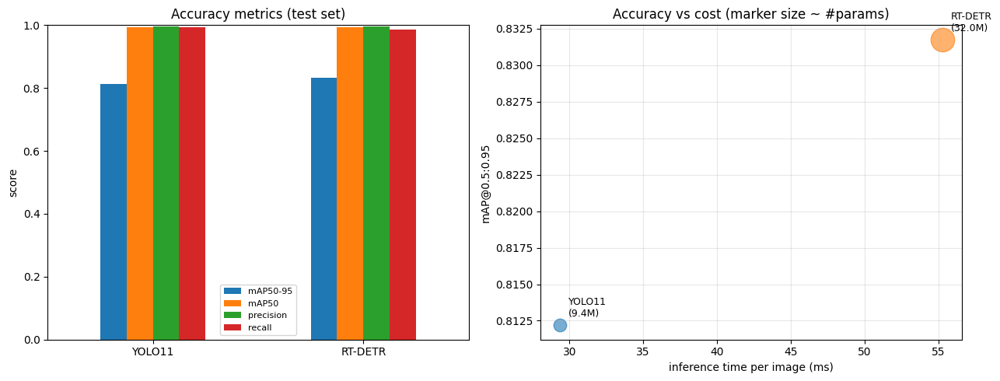

In [11]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))

acc_cols = ["mAP50-95", "mAP50", "precision", "recall"]
comparison[acc_cols].plot.bar(ax=ax1, rot=0)
ax1.set_title("Accuracy metrics (test set)"); ax1.set_ylabel("score"); ax1.set_ylim(0, 1); ax1.legend(fontsize=8)

for name in comparison.index:
    ax2.scatter(comparison.loc[name, "infer_ms"], comparison.loc[name, "mAP50-95"],
                s=max(60, comparison.loc[name, "params(M)"] * 15), alpha=0.6)
    ax2.annotate(f"{name}\n({comparison.loc[name, 'params(M)']:.1f}M)",
                 (comparison.loc[name, "infer_ms"], comparison.loc[name, "mAP50-95"]),
                 textcoords="offset points", xytext=(8, 8), fontsize=9)
ax2.set_xlabel("inference time per image (ms)"); ax2.set_ylabel("mAP@0.5:0.95")
ax2.set_title("Accuracy vs cost (marker size ~ #params)"); ax2.grid(True, alpha=0.3)

plt.tight_layout(); plt.savefig(os.path.join(FIG_DIR, "detection_comparison.png"), dpi=120); plt.show()

Extracts the automatically generated **Precision-Recall curves** from the **test-set evaluation** to visually compare the diagnostic performance of both models.

YOLO11 - Precision-Recall curve:


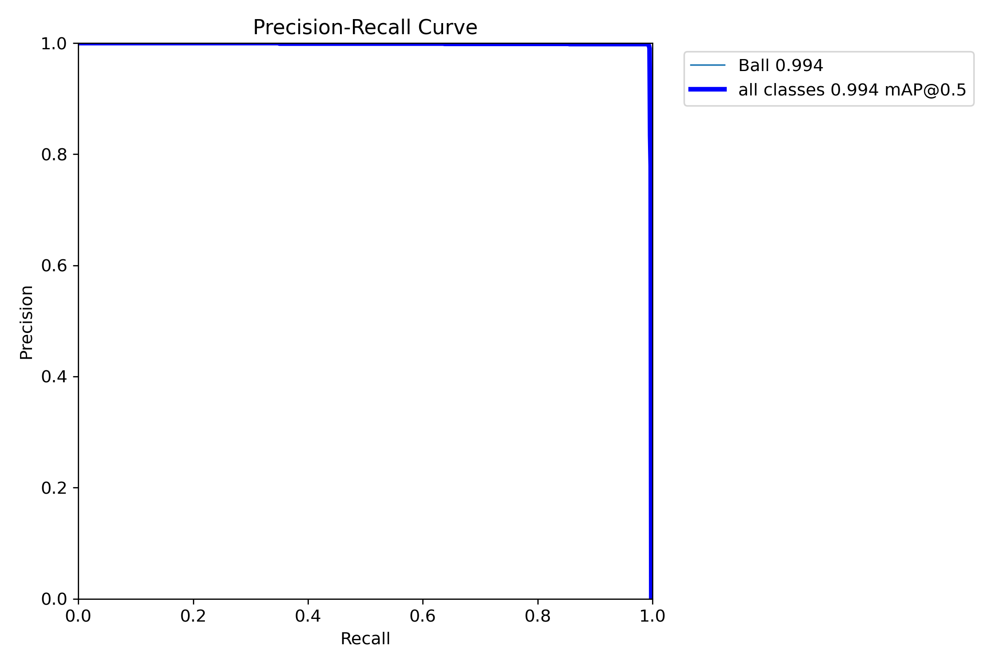

RT-DETR - Precision-Recall curve:


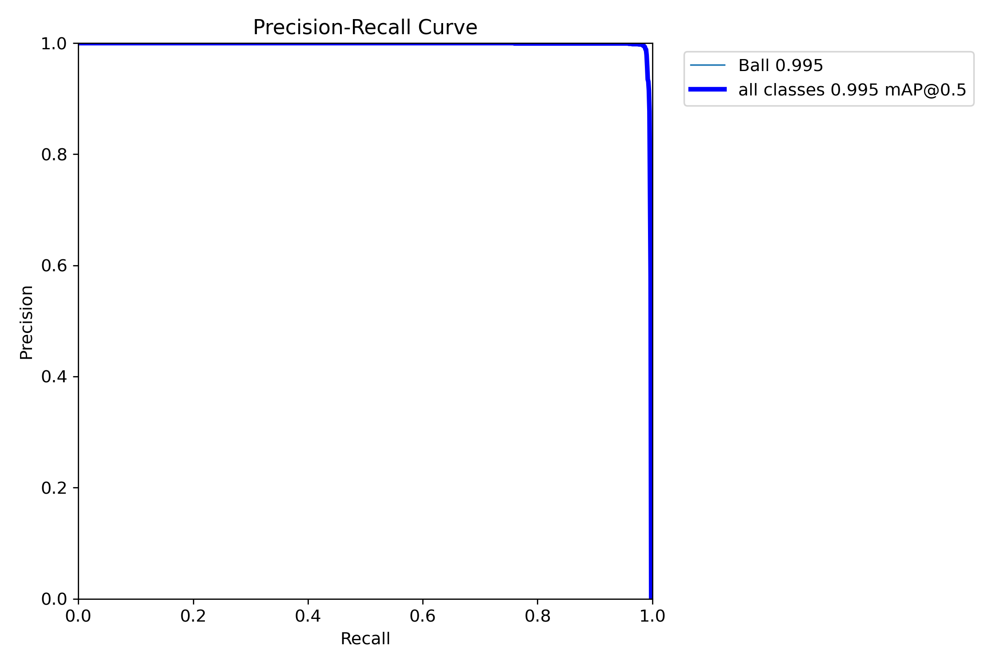

In [12]:
from IPython.display import Image as IPyImage, display

def show_artifact(run_dir, candidates, caption, width=480):
    # Display the first existing file among `candidates` inside run_dir.
    for name in candidates:
        path = os.path.join(run_dir, name)
        if os.path.exists(path):
            print(caption)
            display(IPyImage(filename=path, width=width))
            return
    print("(not found:", caption, "in", run_dir, ")")

for run_dir, title in [(YOLO_TEST_DIR, "YOLO11"), (RTDETR_TEST_DIR, "RT-DETR")]:
    show_artifact(run_dir, ["BoxPR_curve.png", "PR_curve.png"], f"{title} - Precision-Recall curve:")

Generates **training curves** to visualize convergence and early stopping behavior, alongside test-set **confusion matrices** for detailed error analysis.

YOLO11 - training curves:


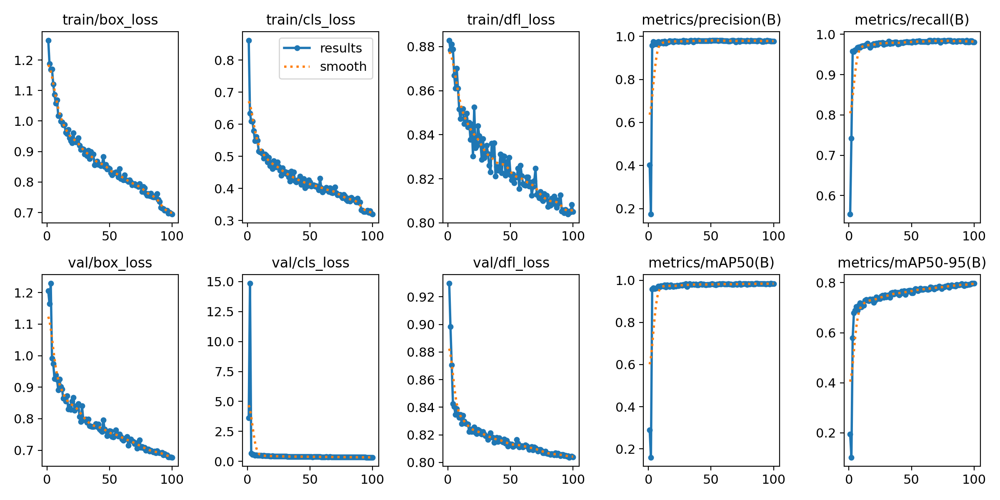

RT-DETR - training curves:


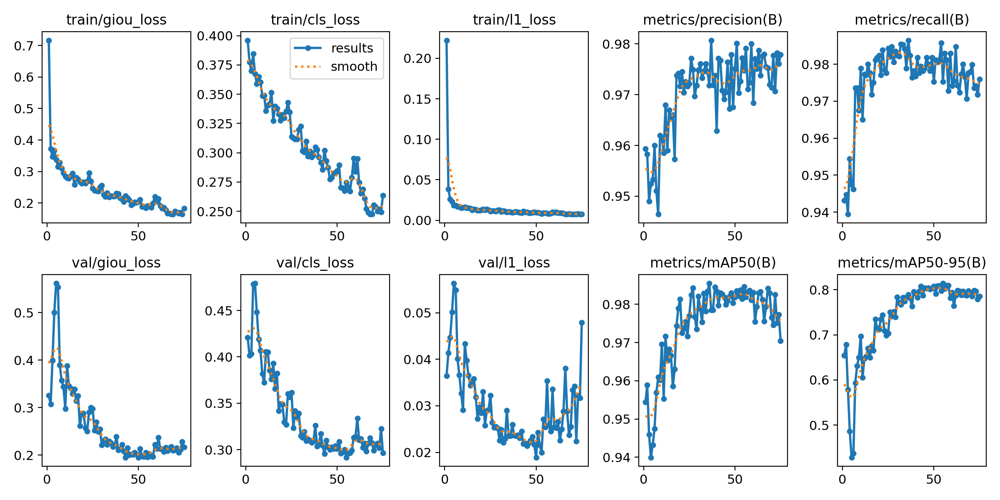

YOLO11 - confusion matrix (test):


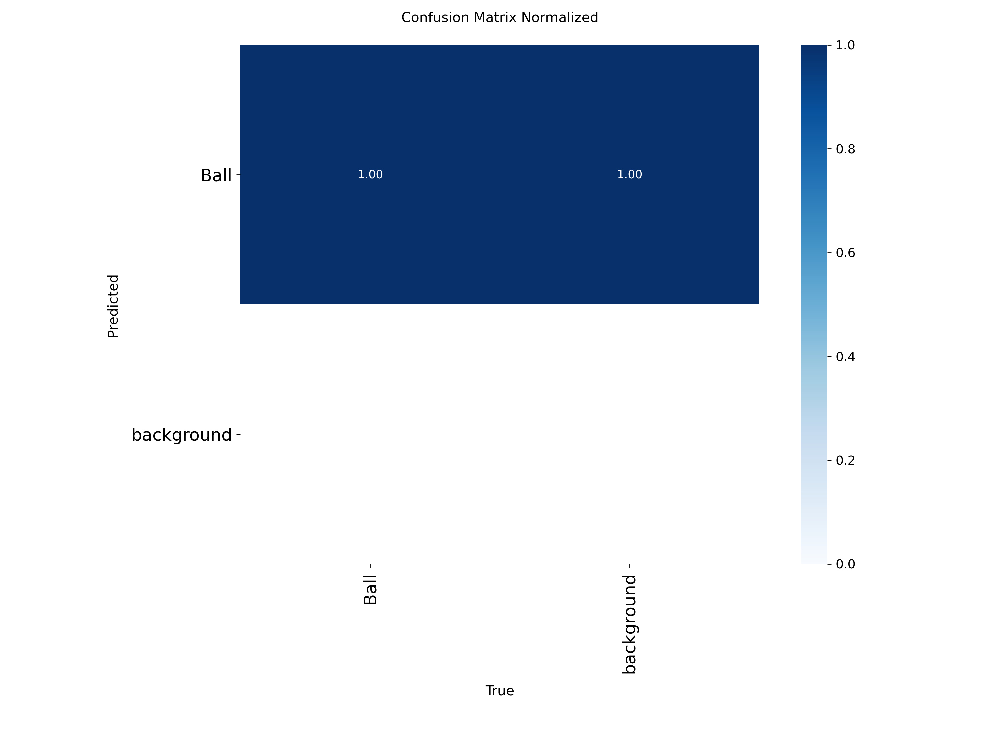

RT-DETR - confusion matrix (test):


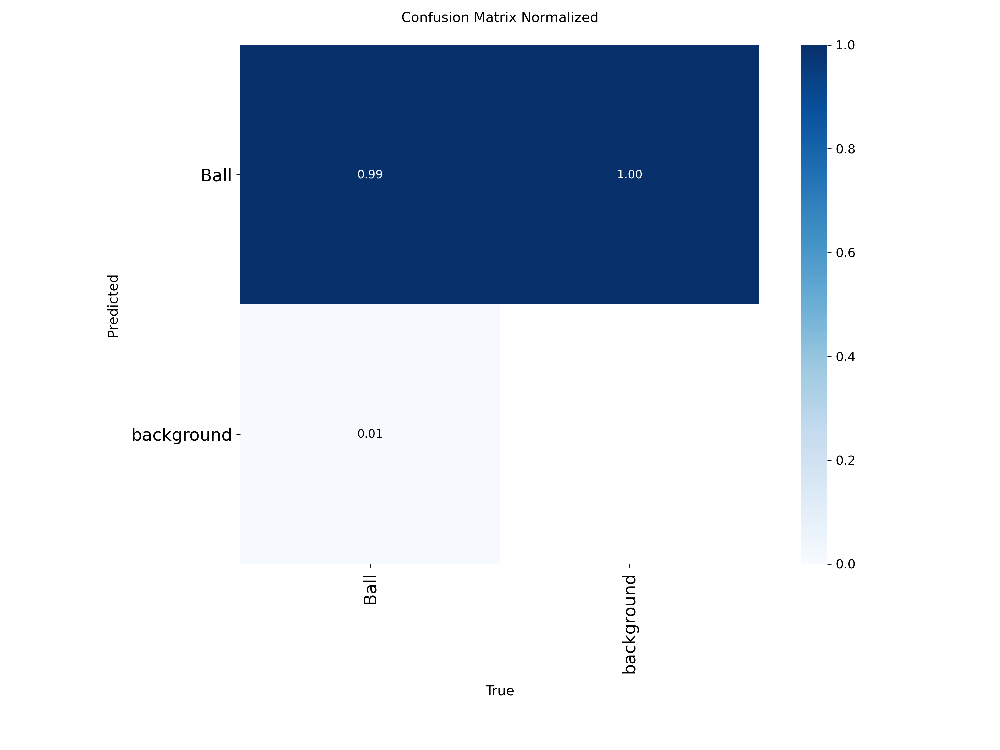

In [ ]:
# Training curves: results.png lives in the training run dir.
for run_dir, title in [(YOLO_RUN, "YOLO11"), (RTDETR_RUN, "RT-DETR")]:
    show_artifact(run_dir, ["results.png"], f"{title} - training curves:", width=820)

# Confusion matrices: from the test evaluation dir (more meaningful than the val one).
for run_dir, title in [(YOLO_TEST_DIR, "YOLO11"), (RTDETR_TEST_DIR, "RT-DETR")]:
    show_artifact(run_dir, ["confusion_matrix_normalized.png", "confusion_matrix.png"],
                  f"{title} - confusion matrix (test):", width=480)

## 7. Qualitative results (good and bad cases)

We run both detectors over every test image and use the **gap between the number
of predicted boxes and the number of ground-truth boxes** as a cheap proxy to
*automatically* pick easy (good) and hard (bad) examples to show. For each chosen
image we display **Ground Truth | YOLO | RT-DETR** side by side.

In [14]:
CONF = 0.25  # confidence threshold for visualisation

# Reload both best models from their weights so this section is self-contained
# (robust even if earlier model objects were freed to save memory).
yolo_best = YOLO(os.path.join(YOLO_RUN, "weights", "best.pt"))
rtdetr_best = RTDETR(os.path.join(RTDETR_RUN, "weights", "best.pt"))

img_dir, lbl_dir = split_dir("test")
test_imgs = sorted(glob.glob(os.path.join(img_dir, "*.*")))

def n_gt(p):
    return count_boxes(os.path.join(lbl_dir, os.path.splitext(os.path.basename(p))[0] + ".txt"))

# total predicted-vs-GT discrepancy per image (summed over both models)
rows = []
for p in test_imgs:
    g = n_gt(p)
    ny = len(yolo_best.predict(p, conf=CONF, imgsz=IMG_SIZE, device=DEVICE, verbose=False)[0].boxes)
    nr = len(rtdetr_best.predict(p, conf=CONF, imgsz=IMG_SIZE, device=DEVICE, verbose=False)[0].boxes)
    rows.append({"path": p, "gt": g, "yolo": ny, "rtdetr": nr, "err": abs(ny - g) + abs(nr - g)})

df = pd.DataFrame(rows).sort_values("err")
good = df.head(3)["path"].tolist()   # smallest discrepancy
bad  = df.tail(3)["path"].tolist()   # largest discrepancy
print("Good (low error):"); print(df.head(3)[["path", "gt", "yolo", "rtdetr"]].to_string(index=False))
print("\nBad (high error):"); print(df.tail(3)[["path", "gt", "yolo", "rtdetr"]].to_string(index=False))

Good (low error):
                                                                                        path  gt  yolo  rtdetr
dataset/test/images/122_sct-mon1_170x250_850x560_png.rf.0d95fadf0ce1cabf97d96ed059460c90.jpg   6     6       6
                         dataset/test/images/119_png.rf.eff91a09289a82f634d7b231b06dbbdd.jpg   9     9       9
                       dataset/test/images/13147_png.rf.3bc88cdb7e99a780d4a4b94e2f49857b.jpg  16    16      16

Bad (high error):
                                                                               path  gt  yolo  rtdetr
dataset/test/images/IMG_20240319_121500_jpg.rf.47ddaaeafe6c2898a73342fc3f5076a3.jpg  16    17      22
              dataset/test/images/13263_png.rf.2f6ecf36c207a101aeec92673f25c149.jpg  16    16      29
              dataset/test/images/13172_png.rf.08f3f9f6717cb384d85a47a3b2acb959.jpg  16    16      45


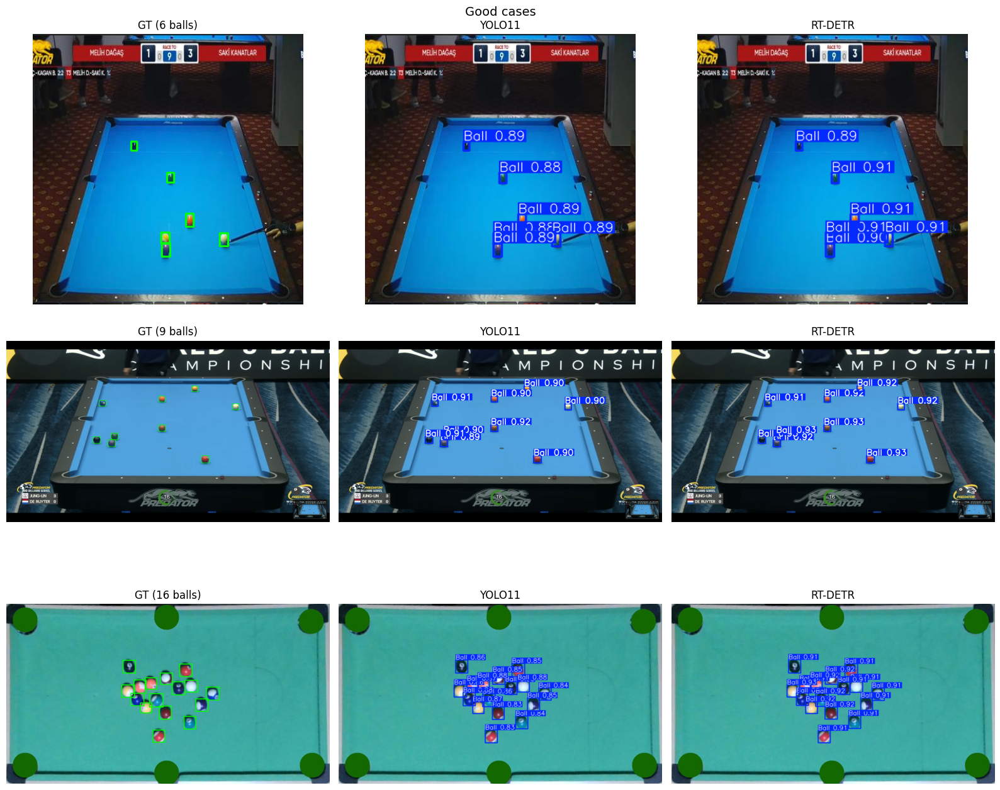

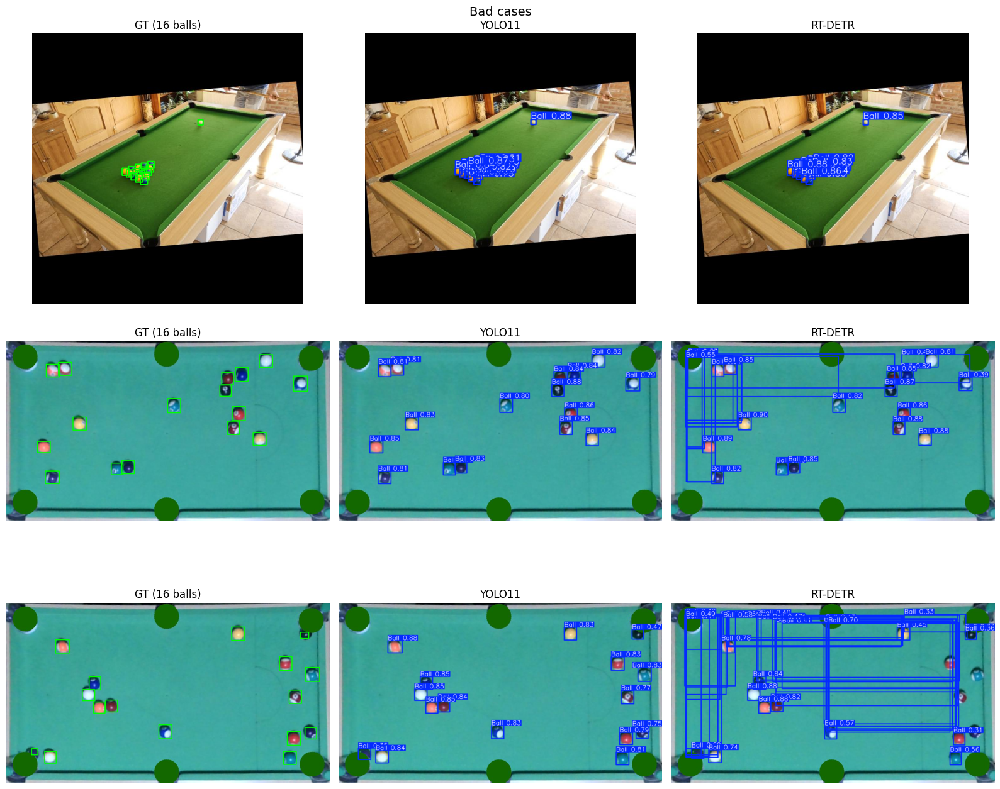

In [15]:
def pred_rgb(model, img_path):
    res = model.predict(img_path, conf=CONF, imgsz=IMG_SIZE, device=DEVICE, verbose=False)[0]
    return cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)

def show_triplets(paths, banner):
    fig, axes = plt.subplots(len(paths), 3, figsize=(16, 4.5 * len(paths)))
    axes = np.atleast_2d(axes)
    for r, p in enumerate(paths):
        lbl = os.path.join(lbl_dir, os.path.splitext(os.path.basename(p))[0] + ".txt")
        axes[r][0].imshow(draw_gt(p, lbl));      axes[r][0].set_title(f"GT ({n_gt(p)} balls)")
        axes[r][1].imshow(pred_rgb(yolo_best, p)); axes[r][1].set_title("YOLO11")
        axes[r][2].imshow(pred_rgb(rtdetr_best, p)); axes[r][2].set_title("RT-DETR")
        for c in range(3):
            axes[r][c].axis("off")
    fig.suptitle(banner, fontsize=14)
    plt.tight_layout()
    plt.savefig(os.path.join(FIG_DIR, banner.lower().replace(" ", "_") + ".png"), dpi=120)
    plt.show()

show_triplets(good, "Good cases")
show_triplets(bad,  "Bad cases")

# Task 3 - Image Retrieval

**Goal:** Retrieve the most visually and spatially similar pool tables for a given query, addressing the lack of ground-truth rankings through a progressive unsupervised and self-supervised pipeline.

**Methodology:** We structured our retrieval system as a benchmark of increasingly robust feature extraction techniques. We initially evaluated naive image-level metrics (MSE), demonstrating their fragility to minor spatial shifts via a translation-consistency sanity check. To achieve semantic and geometric invariance, we transitioned to representation-level retrieval using CNN embeddings. We then explicitly optimized this latent space for our domain using Contrastive Learning, defining positive pairs as augmented copies or alternative camera views of the exact same table, and negative pairs as random images.

**Cross-Task Integration:** Bridging the detection and retrieval domains, we introduced a layout-based retrieval mechanism. By extracting the predicted ball centroids from our trained YOLO11 model, we represent each table as a point set and compute the symmetric Chamfer distance. This strictly geometric baseline matches tables based on physical ball configurations rather than pixel appearance. All approaches are quantitatively validated across the test set using translation-consistency scores, view recall@k, and Cosine Similarity evaluations.

In [1]:
import torch
from torchvision.transforms import v2 as transforms
from torch.nn import functional as F
import torchvision
import matplotlib.pyplot as plt
import os, random, re
import pandas as pd
import numpy as np
from PIL import Image

In [2]:
import os, shutil, glob
import pandas as pd

# The retrieval images named in partition.csv live scattered across the detection
# dataset's train/valid/test folders. Gather them into a single 'images/' folder.
DATASET_DIR = "dataset"
IMAGES_DIR  = "images"
PARTITION   = "partition.csv"

os.makedirs(IMAGES_DIR, exist_ok=True)
index = {os.path.basename(p): p
         for p in glob.glob(os.path.join(DATASET_DIR, "**", "*.jpg"), recursive=True)}

df_part = pd.read_csv(PARTITION)
found, missing = 0, []
for name in df_part["image_name"]:
    src = index.get(name)
    if src is None:
        missing.append(name); continue
    dst = os.path.join(IMAGES_DIR, name)
    if not os.path.exists(dst):
        shutil.copy(src, dst)
    found += 1
print(f"Copied/verified {found}/{len(df_part)} images into '{IMAGES_DIR}/'")
if missing:
    print(f"WARNING: {len(missing)} names not found in {DATASET_DIR}:", missing[:5])


Copied/verified 247/247 images into 'images/'


## Data Preparation

One of the first steps in an image retrieval pipeline is to define the retrieval pool: the set of candidate images among which we want to retrieve the most similar image to a query image.

This set can be the entire training data. Nevertheless, in large datasets, it may be computationally unfeasible to calculate the similarity between the query image and all the data instances. As such, in these cases, we may want to first select a subset of images that can represent our data (e.g., through clustering techniques to find a subset of images that are representative of the entire data).

Since the pool dataset is small, we will consider the entire training data as our retrieval pool. (?)

In [3]:
class PoolDataset:
    def __init__(self, root, partition_file, partition, transform=None):
        self.root = root
        partition_file = pd.read_csv(partition_file)

        idx = np.where(np.asarray(partition_file['partition'].values) == partition)[0]
        self.files = np.asarray(partition_file['image_name'].values)[idx]
        self.transform = transform

    def __len__(self):
        return len(self.files)

    def __getitem__(self, i):
        image = Image.open(os.path.join(self.root, self.files[i]))
        if self.transform:
            image = self.transform(image)
        return image

Define transformations to be applied to the images and data loaders

In [4]:
# Define transformations to be applied to validation data
val_transform = transforms.Compose([
    transforms.ToImage(),
    transforms.Resize((256, 256)),
    transforms.CenterCrop((224, 224)),
    transforms.ToDtype(torch.float32, True),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Define dataloader for the retrieval pool (training data) and query images (test data)
retrieval_pool = PoolDataset('images', 'partition.csv', 'train', val_transform)
query_data = PoolDataset('images', 'partition.csv', 'test', val_transform)

As a use case, let's consider the first test image.

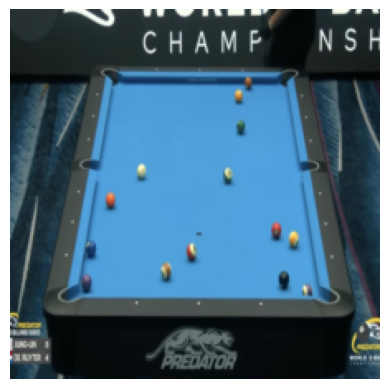

In [5]:
query_image = query_data[0]
query_image_show = query_image.permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
plt.imshow(query_image_show)
_ = plt.axis("off")

Now that we have both the retrieval pool and query data ready to be used, we can start developing the retrieval methods.

The second step in a retrieval pipeline, after defining the retrieval pool and loading the data, is to define a similarity (or distance) measurement to compare the query image with each of the candidates.

We can compute the similarity between two images on two different levels:
* Image Level Similarity: Measurements computed based on the pixels of the two images.
* Representation-Level Similarity: Measurements computed based on the representations of the two images, obtained through a feature extraction network.

## Retrieval using Image Level Similarity

As a baseline for retrieving the top-5 matches, we evaluate two foundational image-level metrics using the `skimage` library:
- **Mean Squared Error (MSE) / Euclidean Distance:** A direct pixel-by-pixel distance measurement. It computes the absolute difference between spatially corresponding pixels, where a lower score denotes higher similarity.
- **Structural Similarity Index (SSIM):** A perceptual similarity metric. Unlike MSE, which is highly sensitive to minor pixel shifts, SSIM evaluates structural inter-dependencies, luminance, and contrast. A higher score (up to 1.0) indicates greater visual similarity.

In [6]:
from skimage.metrics import mean_squared_error, structural_similarity

### Mean Squared Error

Calculate the distance between the query and retrieval candidates and select the top-5 images.

In [7]:
similarities = np.zeros((len(retrieval_pool),))
for i in range(len(retrieval_pool)):
  # calculate the distance between the query image and each candidate
  # torch tensors must be transformed into numpy vectors before computing the mean squared error using skimage
  similarities[i] = mean_squared_error(query_image.numpy(), retrieval_pool[i].numpy())

# select the indexes of the top-5 most similar images
top5_idx = np.argsort(similarities)[:5]  # smallest distance = most similar

Show the top-5 images.

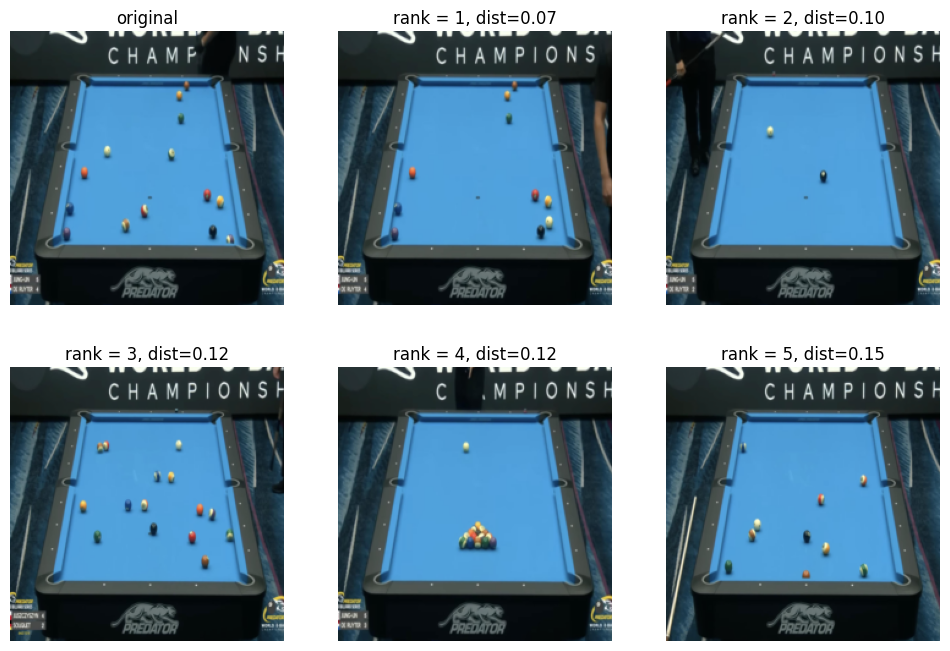

In [8]:
f, axarr = plt.subplots(2, 3, figsize=(12, 8))
axarr[0][0].imshow(query_image_show)
axarr[0][0].set_title("original")
axarr[0][0].axis("off")
for j in range(1, 6):
  img_show = retrieval_pool[top5_idx[j-1]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
  axarr[j // 3][j % 3].imshow(img_show)
  axarr[j // 3][j % 3].set_title(f"rank = {j}, dist={similarities[top5_idx[j-1]]:.2f}")
  axarr[j // 3][j % 3].axis("off")

Since we do not have a ground-truth to compare the results of retrieval, we need to consider other ways to evaluate the results. Since we want to obtain similar pool tables, whose balls are located in similar positions relative to the table (independently of the view), then, intuitively, the query image should be more similar to itself, after applying some transformation that preserves relative ball position (e.g., translation), than any other image of a pool table.

As a sanity check, let's use the previous similarity/distance measurement to compare the similarity between the query and its most similar image with the similarity between the query and itself, after a small transformation.

Apply a translation of 5 pixels to the query image and compare the distance obtained between the query and its translated version with the distance between the query and the top1 retrieval result.

(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

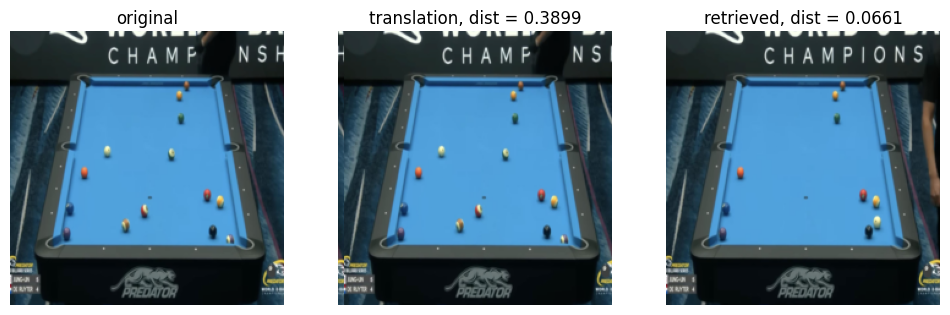

In [9]:
# apply translation of 5 pixels to the right to the query image
translate_query_image = torch.roll(query_image, shifts=5, dims=2)  # 5 px to the right (width axis)
# calculate the mean squared error between the query and its translated version
sim_trans = mean_squared_error(query_image.numpy(), translate_query_image.numpy())

f, axarr = plt.subplots(1, 3, figsize=(12, 4))
axarr[0].imshow(query_image_show)
axarr[0].set_title("original")
axarr[0].axis("off")

translate_query_image_show = translate_query_image.permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[1].imshow(translate_query_image_show)
axarr[1].set_title(f"translation, dist = {sim_trans:.4f}")
axarr[1].axis("off")

img_show = retrieval_pool[top5_idx[0]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[2].imshow(img_show)
axarr[2].set_title(f"retrieved, dist = {similarities[top5_idx[0]]:.4f}")
axarr[2].axis("off")

### Structural Similarity Index Measure

Now, let's repeat the retrieval process but with the structural similarity index measure. This measure provides values in the range [0, 1], where 1 represents the maximum similarity possible between two images.

In [10]:
similarities = np.zeros((len(retrieval_pool),))
for i in range(len(retrieval_pool)):
  # calculate the similarities between the query image and the candidate using structural similarity 
  cand = retrieval_pool[i].numpy()
  similarities[i] = structural_similarity(query_image.numpy(), cand, channel_axis=0, data_range=float(cand.max() - cand.min()))

# select the indexes of the top-5 most similar images
top5_idx = np.argsort(similarities)[::-1][:5]  # higher SSIM = more similar

Show the results.

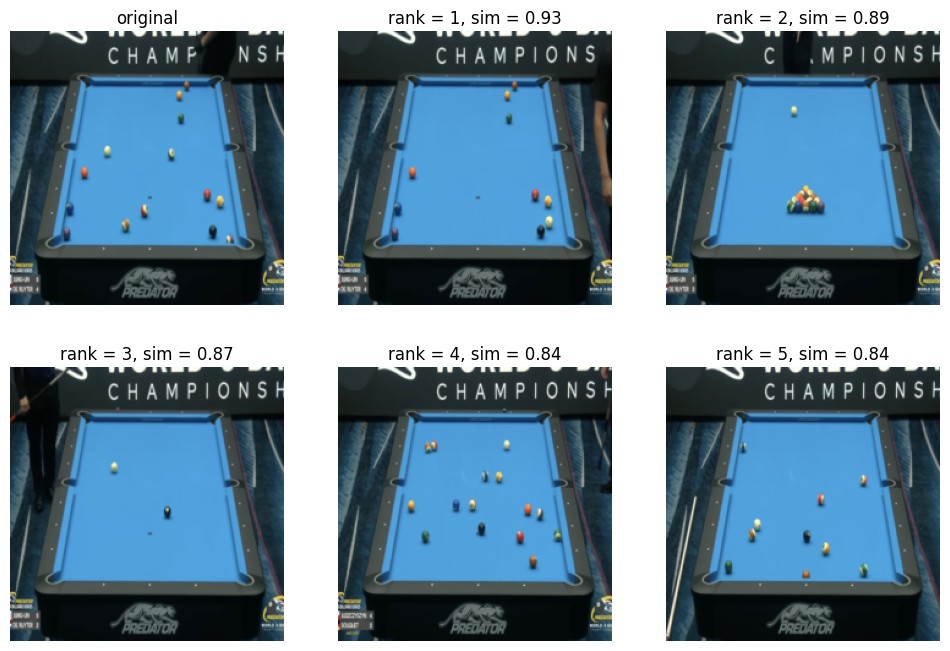

In [11]:
f, axarr = plt.subplots(2, 3, figsize=(12, 8))
axarr[0][0].imshow(query_image_show)
axarr[0][0].set_title("original")
axarr[0][0].axis("off")
for j in range(1, 6):
  img_show = retrieval_pool[top5_idx[j-1]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
  axarr[j // 3][j % 3].imshow(img_show)
  axarr[j // 3][j % 3].set_title(f"rank = {j}, sim = {similarities[top5_idx[j-1]]:.2f}")
  axarr[j // 3][j % 3].axis("off")

Perform sanity check.

(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

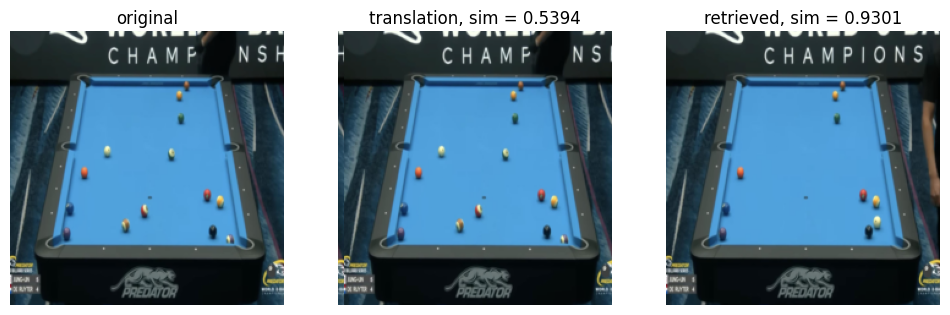

In [12]:
# apply translation of 5 pixels to the right to the query image
translate_query_image = torch.roll(query_image, shifts=5, dims=2)
# calculate the structural similarity between the query and its translated version
q_np, t_np = query_image.numpy(), translate_query_image.numpy()
sim_trans = structural_similarity(q_np, t_np, channel_axis=0, data_range=float(max(q_np.max(), t_np.max()) - min(q_np.min(), t_np.min())))

f, axarr = plt.subplots(1, 3, figsize=(12, 4))
axarr[0].imshow(query_image_show)
axarr[0].set_title("original")
axarr[0].axis("off")

translate_query_image_show = translate_query_image.permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[1].imshow(translate_query_image_show)
axarr[1].set_title(f"translation, sim = {sim_trans:.4f}")
axarr[1].axis("off")

img_show = retrieval_pool[top5_idx[0]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[2].imshow(img_show)
axarr[2].set_title(f"retrieved, sim = {similarities[top5_idx[0]]:.4f}")
axarr[2].axis("off")

Notice how all the images retrieved using image-level similarity measurements have the exact same pose. The problem with these metrics is that they only take into consideration pixel-level or structural similarity, while disregarding semantic information. In the image retrieval task, we are more concerned with obtaining pool tables with balls located in similar positions relative to the table, rather than just obtaining tables in similar poses. As such, we need to develop models capable of capturing semantic information.

## Retrieval using Representation-Level Similarity with a Pretrained Model

As a first step towards considering semantic information in the retrieval task, let's leverage the capacity of deep learning models to extract semantically rich features from images. Let's start by using the backbone of a pretrained model (e.g. ResNet) to extract features from images and measure their similarity.

In [13]:
class FeatureExtractor(torch.nn.Module):
    def __init__(self):
        super().__init__()
        # load resnet backbone
        backbone = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT)
        # get the feature extractor of the pretrained model (by removing the classification head from the model)
        self.encoder = torch.nn.Sequential(*list(backbone.children())[:-1])  # drop the fc head
        # freeze the model
        for param in self.encoder.parameters():
            param.requires_grad = False

    def forward(self, x):
        x = self.encoder(x)
        return x

In [14]:
model = FeatureExtractor()

Now that we have a model that translates images into vectorial representations, we can use it to calculate the distance (or similarity) between images. Like in image-level similarity, we also need to define a similarity/distance measure to compare the vectorial representations. Common measurements include:
* Mean squared error
* Cosine similarity

Note that structural similarity is an image similarity metric and cannot be used with vectorial representations.

In [16]:
# apply model to obtain the representation of the query image
model.eval()
query_features = model(query_image.unsqueeze(0)).flatten().detach().numpy()

similarities = np.zeros((len(retrieval_pool),))
for i in range(len(retrieval_pool)):
  # apply model to obtain the representation of the retrieval candidate
  train_features = model(retrieval_pool[i].unsqueeze(0)).flatten().detach().numpy()
  # compute mean squared error distance between query and candidate representations
  similarities[i] = mean_squared_error(query_features, train_features)

# get indexes of top 5 most similar images
top5_idx = np.argsort(similarities)[:5]

Show the results.

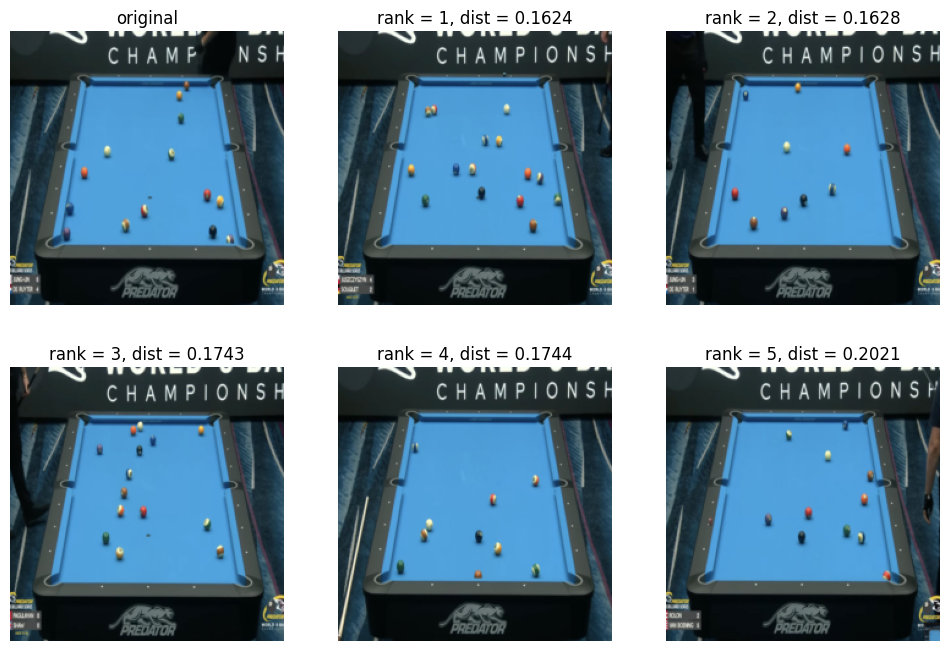

In [17]:
f, axarr = plt.subplots(2, 3, figsize=(12, 8))
axarr[0][0].imshow(query_image_show)
axarr[0][0].set_title("original")
axarr[0][0].axis("off")
for j in range(1, 6):
  img_show = retrieval_pool[top5_idx[j-1]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
  axarr[j // 3][j % 3].imshow(img_show)
  axarr[j // 3][j % 3].set_title(f"rank = {j}, dist = {similarities[top5_idx[j-1]]:.4f}")
  axarr[j // 3][j % 3].axis("off")

Perform sanity check.

(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

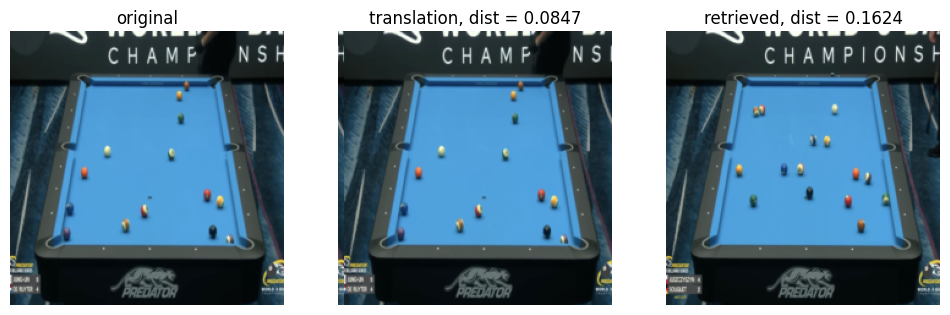

In [18]:
# apply translation of 5 pixels to the query image
translate_query_image = torch.roll(query_image, shifts=5, dims=2)
# get the augmented image's features
translate_query_features = model(translate_query_image.unsqueeze(0)).flatten().detach().numpy()
# calculate the mean squared error between the features of the query image and its augmented version
sim_trans = mean_squared_error(query_features, translate_query_features)

f, axarr = plt.subplots(1, 3, figsize=(12, 4))
axarr[0].imshow(query_image_show)
axarr[0].set_title("original")
axarr[0].axis("off")

translate_query_image_show = translate_query_image.permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[1].imshow(translate_query_image_show)
axarr[1].set_title(f"translation, dist = {sim_trans:.4f}")
axarr[1].axis("off")

img_show = retrieval_pool[top5_idx[0]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[2].imshow(img_show)
axarr[2].set_title(f"retrieved, dist = {similarities[top5_idx[0]]:.4f}")
axarr[2].axis("off")

The pretrained model was not optimized on the pool dataset and, thus, has a limited capacity to capture semantically meaningful features. As such, this model may not be ideal for the retrieval task, and may need to be optimized for this task. As there are no ground-truth labels for retrieval, we can consider two main methods for optimizing the feature extractor:
 * Direct optimization: Directly optimizing the feature extractor by computing some loss function directly on the features extracted by the feature extractor - we need to decide which loss function and associated training technique can be used to optimize the network for retrieval
 * Proxy Task: Training the feature extractor as part of a network developed for a task other than retrieval, but that requires extracting rich semantic features relative to the pool game from the image - we need to decide which task can be used for this


## Optimizing the Pretrained Model for Retrieval through Direct Optimization


In the retrieval task, an image should always be the most similar to itself, independently of any transformation that does not change the relative position of the balls. Through the sanity checks, we saw that previous methods did not consider the query image to be similar to itself after a very small translation. To fix this behaviour, we can directly optimize the feature extractor to minimize the distance to itself.

Nevertheless, simply minimizing the distance between augmented versions of the same image is not enough as it can lead to the network simply compacting the latent space and minimizing the distance between all data samples. As such, we also need to maximize the distance between different images.

This training process with a loss function where we minimize the distance between specific data samples while maximizing it for other samples is called Contrastive Learning. In contrastive learning, we need positive pairs with samples whose distance we want to minimize, and negative pairs whose distance we want to maximize. To account for data imbalance, let's build a data loader that can be used to obtain three samples at once: the original image, its augmented version and a randomly selected image.

In [19]:
class TripletPoolDataset:
    def __init__(self, root, partition_file, partition, transform=None, val_transform=None):
        self.root = root
        partition_file = pd.read_csv(partition_file)

        idx = np.where(np.asarray(partition_file['partition'].values) == partition)[0]
        self.files = np.asarray(partition_file['image_name'].values)[idx]
        self.transform = transform
        self.val_transform = val_transform
        self.partition = partition

    def __len__(self):
        return len(self.files)

    def __getitem__(self, i):
        image = Image.open(os.path.join(self.root, self.files[i]))

        if self.partition == "train":
            # select a random image of the data (except the current image at index i)
            candidate_idx = np.concatenate((np.arange(len(self.files)-1)[:i], np.arange(len(self.files)-1)[i+1:]))
            neg_idx = random.choice(candidate_idx)
        else:
            # in the validation set, we need to make sure that the negative pair is always the same 
            # to better monitor the performance of the model
            neg_idx = i+1
            if neg_idx >= len(self.files):
                neg_idx = 0

        neg_image = Image.open(os.path.join(self.root, self.files[neg_idx]))

        # apply transformations to the query, negative (randomly selected) sample and positive (augmented) sample
        image_query = self.val_transform(image)        # clean anchor
        image_pos = self.transform(image)             # augmented view of the SAME image (positive)
        image_neg = self.val_transform(neg_image)      # a DIFFERENT image (negative)

        return image_query, image_pos, image_neg

Define datasets and data loaders.

In [20]:
aug_transform = transforms.Compose([
    transforms.ToImage(),
    transforms.Resize((256, 256)),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.CenterCrop((224, 224)),
    transforms.ToDtype(torch.float32, True),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

train_dataset = TripletPoolDataset('images', 'partition.csv', 'train', aug_transform, val_transform)
val_dataset = TripletPoolDataset('images', 'partition.csv', 'valid', aug_transform, val_transform)

batch_size = 8
num_workers = 1
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size, shuffle=True, num_workers=num_workers)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size, num_workers=num_workers)

Define the Feature Extractor model.

In [21]:
class FeatureExtractor(torch.nn.Module):
    def __init__(self):
        super().__init__()
        # load resnet backbone (or any other backbone of your choosing)
        backbone = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT)
        # get the feature extractor of the pretrained model (by removing the classification head from the model)
        self.encoder = torch.nn.Sequential(*list(backbone.children())[:-1])  # 512-d features (trainable)
        # this time we want to train the encoder, so we do not freeze it

    def forward(self, x):
        x = self.encoder(x)
        return x

In [22]:
# device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('using device:', device)

# create model
model = FeatureExtractor()
model = model.to(device)

using device: cuda


In [23]:
# Define optimizer
optimizer = torch.optim.AdamW(model.parameters())
epochs = 20

# Define loss
loss_fn = torch.nn.MSELoss(reduction="none")

Define one epoch of the training process. Here, we need to define the contrastive loss function where we maximize the distance between the query image and a randomly selected image of the data (negative sample) and minimize the distance between the query and its augmented version (positive sample).

Note that, when maximizing the distance without any restrictions, the network may lead to infinitely large distances, leading to a sparse latent space. To avoid this, we can restrict the maximum distance between two different samples by defining a margin value such that any value above that margin would lead to the exact same loss (i.e., clip the distance so that it does not go beyond the margin when computing the loss).

In [24]:
def one_epoch(model, optimizer, dataloader, is_training):
  model.train() if is_training else model.eval()
  avg_loss = 0
  for i, (image_query, image_pos, image_neg) in enumerate(dataloader):
    image_query = image_query.to(device)
    image_pos = image_pos.to(device)
    image_neg = image_neg.to(device)
    # extract representations of the query, positive and negative samples using the feature extractor
    rep_query = model(image_query).flatten(1)   # (B, 512)
    rep_pos = model(image_pos).flatten(1)
    rep_neg = model(image_neg).flatten(1)

    # loss term to minimize the distance between the query and positive sample
    loss = torch.mean(loss_fn(rep_query, rep_pos))   # pull anchor & positive (augmented self) together
    # loss term to maximize the distance between the query and the negative (random) sample
    m = 1.
    d_neg = loss_fn(rep_query, rep_neg).mean(dim=1)            # (B,) per-sample distance
    loss = loss + torch.mean(torch.clamp(m - d_neg, min=0.0))  # push anchor & negative apart up to margin m
    
    if is_training:
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    avg_loss += loss.item() / len(dataloader)
  return avg_loss

Train the model (note that in contrastive learning, we usually need to train the network for a large number of epochs).

In [25]:
train_history = {'loss': [], 'metric': []}
val_history = {'loss': [], 'metric': []}
for epoch in range(epochs):
  # compute train
  avg_loss = one_epoch(model, optimizer, train_dataloader, True)
  train_history['loss'].append(avg_loss)
  print(f'Epoch {epoch+1:2d}/{epochs} - Train loss: {avg_loss}')
  # compute validation statistics
  avg_loss = one_epoch(model, optimizer, val_dataloader, False)
  val_history['loss'].append(avg_loss)
  print(f'Epoch {epoch+1:2d}/{epochs} - Val   loss: {avg_loss}')

MIOpen(HIP): Warning [FindSolutionImpl] Invalid config loaded from Perf Db: ConvBinWinogradRxSf3x2: 38. Performance may degrade.
MIOpen(HIP): Warning [FindSolutionImpl] Invalid config loaded from Perf Db: ConvBinWinogradRxSf3x2: 56. Performance may degrade.
MIOpen(HIP): Warning [FindSolutionImpl] Invalid config loaded from Perf Db: ConvBinWinogradRxSf3x2: 40. Performance may degrade.
MIOpen(HIP): Warning [FindSolutionImpl] Invalid config loaded from Perf Db: ConvBinWinogradRxSf3x2: 39. Performance may degrade.


Epoch  1/20 - Train loss: 0.28030600341466766
Epoch  1/20 - Val   loss: 0.5812356372674305
Epoch  2/20 - Train loss: 0.21664283875949109
Epoch  2/20 - Val   loss: 0.7883358796437581
Epoch  3/20 - Train loss: 0.25908947821993095
Epoch  3/20 - Val   loss: 0.5705127517382304
Epoch  4/20 - Train loss: 0.260450799161425
Epoch  4/20 - Val   loss: 0.5480171342690785
Epoch  5/20 - Train loss: 0.22405432995695335
Epoch  5/20 - Val   loss: 0.3848504573106766
Epoch  6/20 - Train loss: 0.19860716507985038
Epoch  6/20 - Val   loss: 0.40966287255287176
Epoch  7/20 - Train loss: 0.1720892759039998
Epoch  7/20 - Val   loss: 0.4092870453993479
Epoch  8/20 - Train loss: 0.2200413546883143
Epoch  8/20 - Val   loss: 0.44845889012018836
Epoch  9/20 - Train loss: 0.21555181363454237
Epoch  9/20 - Val   loss: 0.3593715826670329
Epoch 10/20 - Train loss: 0.20765569161337158
Epoch 10/20 - Val   loss: 0.4691210289796194
Epoch 11/20 - Train loss: 0.19970879868532604
Epoch 11/20 - Val   loss: 0.35251866777737934


Get the top-5 most similar images.

In [26]:
# apply model to obtain the representation of the query image
model.eval()
query_features = model(query_image.unsqueeze(0).to(device)).flatten().detach().cpu().numpy()

similarities = np.zeros((len(retrieval_pool),))
for i in range(len(retrieval_pool)):
  # apply model to obtain the representation of the retrieval candidate
  train_features = model(retrieval_pool[i].unsqueeze(0).to(device)).flatten().detach().cpu().numpy()
  # compute mean squared error distance between query and candidate representations
  similarities[i] = mean_squared_error(query_features, train_features)

# get indexes of top 5 most similar images
top5_idx = np.argsort(similarities)[:5]

Show the results.

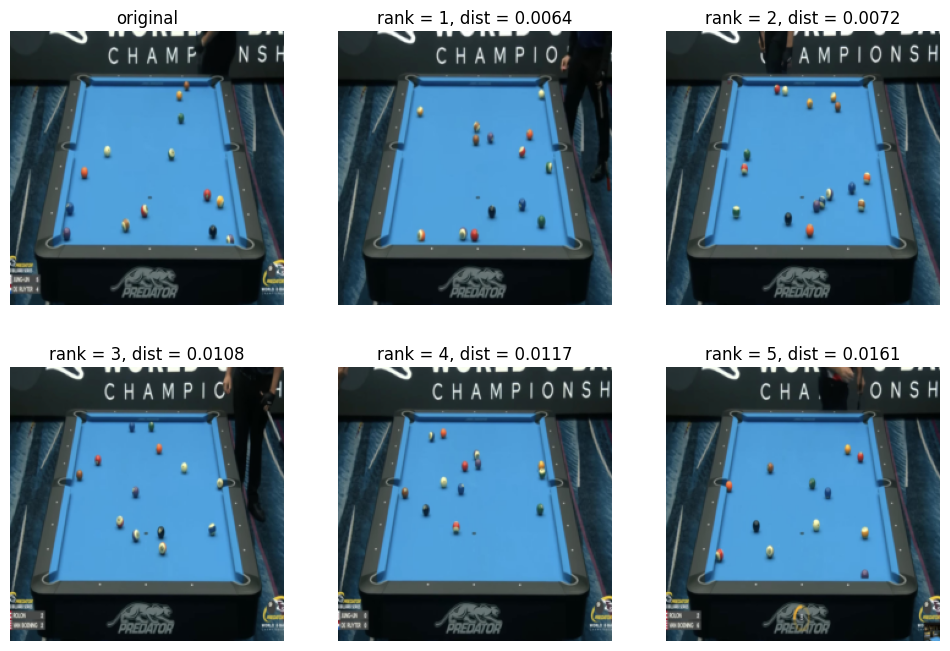

In [27]:
f, axarr = plt.subplots(2, 3, figsize=(12, 8))
axarr[0][0].imshow(query_image_show)
axarr[0][0].set_title("original")
axarr[0][0].axis("off")
for j in range(1, 6):
  img_show = retrieval_pool[top5_idx[j-1]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
  axarr[j // 3][j % 3].imshow(img_show)
  axarr[j // 3][j % 3].set_title(f"rank = {j}, dist = {similarities[top5_idx[j-1]]:.4f}")
  axarr[j // 3][j % 3].axis("off")

Perform sanity check.

(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

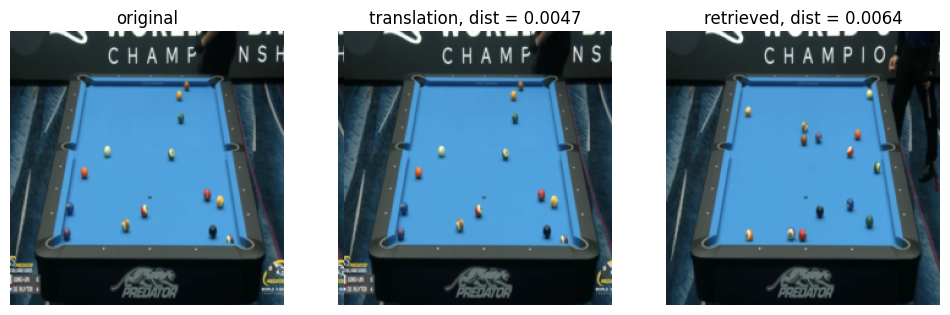

In [28]:
# apply translation of 5 pixels to the query image
translate_query_image = torch.roll(query_image, shifts=5, dims=2)
# get the augmented image's features
translate_query_features = model(translate_query_image.unsqueeze(0).to(device)).flatten().detach().cpu().numpy()
# calculate the mean squared error between the features of the query image and its augmented version
sim_trans = mean_squared_error(query_features, translate_query_features)

f, axarr = plt.subplots(1, 3, figsize=(12, 4))
axarr[0].imshow(query_image_show)
axarr[0].set_title("original")
axarr[0].axis("off")

translate_query_image_show = translate_query_image.permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[1].imshow(translate_query_image_show)
axarr[1].set_title(f"translation, dist = {sim_trans:.4f}")
axarr[1].axis("off")

img_show = retrieval_pool[top5_idx[0]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[2].imshow(img_show)
axarr[2].set_title(f"retrieved, dist = {similarities[top5_idx[0]]:.4f}")
axarr[2].axis("off")

In this example with contrastive learning, we are maximizing the distance between random pairs of images of the data in the same manner, independently of how similar these images may be. However, in the dataset, there are some cases of different images that may be more similar, and others more different (e.g., an image with only 2 balls is likely more different to an image with 10 balls than another image with 10 balls).

**Additional Suggestion**: Notice that, in the dataset, there are images with the letters a, t and f next to the image number. These images typically represent different views of the same pool table. These images should be considered as similar as possible by the retrieval model.

## Optimizing the Pretrained Model for Retrieval through Proxy Task

As a proxy task, let's train the feature extractor as part of an autoencoder trained for image reconstruction.

Get the training and validation dataset and dataloader.

In [29]:
aug_transform = transforms.Compose([
    transforms.ToImage(),
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    # (these are not strictly needed but can help avoid overfitting)
    transforms.CenterCrop((224, 224)),
    transforms.ToDtype(torch.float32, True),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

train_dataset = PoolDataset('images', 'partition.csv', 'train', aug_transform)
val_dataset = PoolDataset('images', 'partition.csv', 'valid', val_transform)

batch_size = 8
num_workers = 2

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size, shuffle=True, num_workers=num_workers)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size, num_workers=num_workers)

Implement the autoencoder model.


In [30]:
class MyAutoencoder(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()
        # load resnet backbone
        backbone = torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT)
        # get the feature extractor of the pretrained model (by removing the classification head and global average pooling layer from the model)
        self.encoder = torch.nn.Sequential(*list(backbone.children())[:-2])  # drop fc+avgpool -> (B,512,7,7)
        # add a decoder to the model
        self.decoder = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(512, 256, 2, stride=2), torch.nn.BatchNorm2d(256), torch.nn.ReLU(),  # 7->14
            torch.nn.ConvTranspose2d(256, 128, 2, stride=2), torch.nn.BatchNorm2d(128), torch.nn.ReLU(),  # 14->28
            torch.nn.ConvTranspose2d(128, 64, 2, stride=2),  torch.nn.BatchNorm2d(64),  torch.nn.ReLU(),  # 28->56
            torch.nn.ConvTranspose2d(64, 32, 2, stride=2),   torch.nn.BatchNorm2d(32),  torch.nn.ReLU(),  # 56->112
            torch.nn.ConvTranspose2d(32, 16, 2, stride=2),   torch.nn.BatchNorm2d(16),  torch.nn.ReLU(),  # 112->224
        )
        # define the last layer of the model
        self.out = torch.nn.Conv2d(16, out_channels, kernel_size=1)  # map back to image channels

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        x = self.out(x)
        return x

In [31]:
# device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('using device:', device)

model = MyAutoencoder(3)
model = model.to(device)

using device: cuda


In [32]:
# Define optimizer
optimizer = torch.optim.AdamW(model.parameters())
epochs = 10

# Define image reconstruction loss
loss_fn = torch.nn.MSELoss()   # pixel-wise image reconstruction loss

Implement one epoch of the training process.

In [33]:
def one_epoch(model, optimizer, dataloader, is_training):
  model.train() if is_training else model.eval()
  avg_loss = 0
  for i, images in enumerate(dataloader):
    images = images.to(device)
    reconstruction = model(images)
    loss = loss_fn(reconstruction, images)
    if is_training:
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    avg_loss += loss.item() / len(dataloader)
  return avg_loss

Train the model.

In [34]:
train_history = {'loss': [], 'metric': []}
val_history = {'loss': [], 'metric': []}
for epoch in range(epochs):
  # compute train
  avg_loss = one_epoch(model, optimizer, train_dataloader, True)
  train_history['loss'].append(avg_loss)
  print(f'Epoch {epoch+1:2d}/{epochs} - Train loss: {avg_loss}')
  # compute validation statistics
  avg_loss = one_epoch(model, optimizer, val_dataloader, False)
  val_history['loss'].append(avg_loss)
  print(f'Epoch {epoch+1:2d}/{epochs} - Val   loss: {avg_loss}')

Epoch  1/10 - Train loss: 1.6850014466505785
Epoch  1/10 - Val   loss: 1.2527554035186768
Epoch  2/10 - Train loss: 1.1053819335423984
Epoch  2/10 - Val   loss: 0.8264128764470418
Epoch  3/10 - Train loss: 0.759785709472803
Epoch  3/10 - Val   loss: 0.6528849204381307
Epoch  4/10 - Train loss: 0.5461721821473196
Epoch  4/10 - Val   loss: 0.49668341875076294
Epoch  5/10 - Train loss: 0.4225811671752196
Epoch  5/10 - Val   loss: 0.42233705520629883
Epoch  6/10 - Train loss: 0.3672106552582521
Epoch  6/10 - Val   loss: 0.3415014644463857
Epoch  7/10 - Train loss: 0.32963092223956036
Epoch  7/10 - Val   loss: 0.30726760625839233
Epoch  8/10 - Train loss: 0.29033477776325656
Epoch  8/10 - Val   loss: 0.26267734666665393
Epoch  9/10 - Train loss: 0.27852123861129463
Epoch  9/10 - Val   loss: 0.2487995872894923
Epoch 10/10 - Train loss: 0.2825147841985409
Epoch 10/10 - Val   loss: 0.2514459043741226


Get the top-5 most similar images.

In [35]:
# apply encoder of the model to obtain the representation of the query image
model.eval()
query_features = model.encoder(query_image.unsqueeze(0).to(device)).flatten().detach().cpu().numpy()

similarities = np.zeros((len(retrieval_pool),))
for i in range(len(retrieval_pool)):
  # apply encoder of the model to obtain the representation of the retrieval candidate
  train_features = model.encoder(retrieval_pool[i].unsqueeze(0).to(device)).flatten().detach().cpu().numpy()
  # compute mean squared error distance between query and candidate representations
  similarities[i] = mean_squared_error(query_features, train_features)

# get indexes of top 5 most similar images
top5_idx = np.argsort(similarities)[:5]

Show the results.

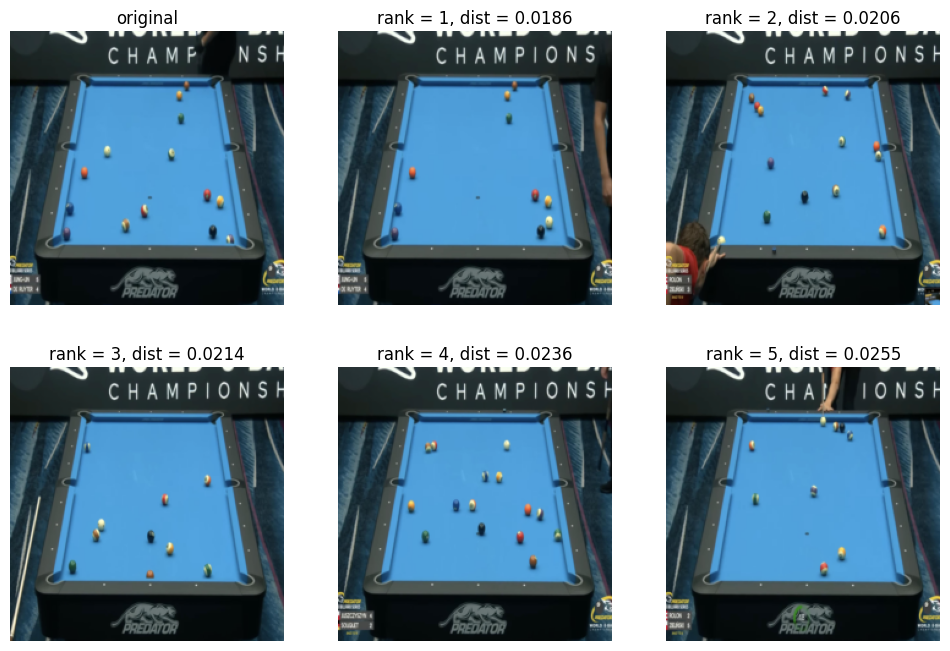

In [36]:
f, axarr = plt.subplots(2, 3, figsize=(12, 8))
axarr[0][0].imshow(query_image_show)
axarr[0][0].set_title("original")
axarr[0][0].axis("off")
for j in range(1, 6):
  img_show = retrieval_pool[top5_idx[j-1]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
  axarr[j // 3][j % 3].imshow(img_show)
  axarr[j // 3][j % 3].set_title(f"rank = {j}, dist = {similarities[top5_idx[j-1]]:.4f}")
  axarr[j // 3][j % 3].axis("off")

Perform sanity check.

(np.float64(-0.5), np.float64(223.5), np.float64(223.5), np.float64(-0.5))

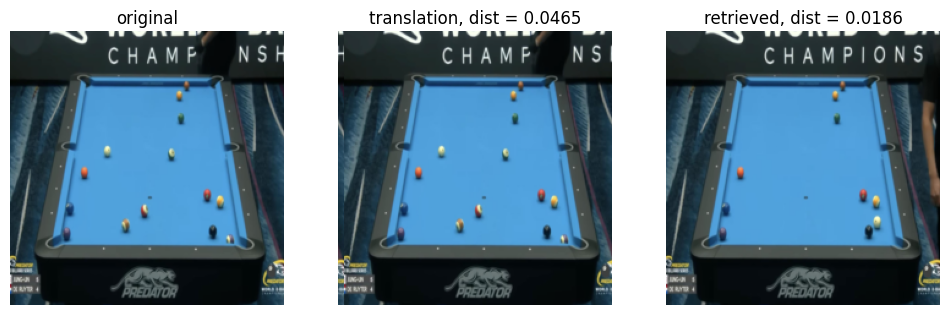

In [37]:
# apply translation of 5 pixels to the query image
translate_query_image = torch.roll(query_image, shifts=5, dims=2)
# get the augmented image's features by applying the model's encoder
translate_query_features = model.encoder(translate_query_image.unsqueeze(0).to(device)).flatten().detach().cpu().numpy()
# calculate the mean squared error between the features of the query image and its augmented version
sim_trans = mean_squared_error(query_features, translate_query_features)

f, axarr = plt.subplots(1, 3, figsize=(12, 4))
axarr[0].imshow(query_image_show)
axarr[0].set_title("original")
axarr[0].axis("off")

translate_query_image_show = translate_query_image.permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[1].imshow(translate_query_image_show)
axarr[1].set_title(f"translation, dist = {sim_trans:.4f}")
axarr[1].axis("off")

img_show = retrieval_pool[top5_idx[0]].permute(1, 2, 0)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
axarr[2].imshow(img_show)
axarr[2].set_title(f"retrieved, dist = {similarities[top5_idx[0]]:.4f}")
axarr[2].axis("off")

## Quantitative Evaluation & Multi-Query Analysis

To rigorously validate our retrieval pipeline beyond qualitative visual inspection, we introduced a systematic quantitative evaluation framework across all 20 test queries. Since official ground-truth rankings are unavailable, we engineered two label-free metrics to objectively measure representation quality:

First, we assess **translation-consistency** to verify spatial robustness, reporting the fraction of queries whose representation remains mathematically closer to their own slightly-translated version than to distinct tables in the dataset. 

Second, we measure **view recall@k** as a semantic sanity check. By exploiting training images that capture the exact same table from alternative camera angles (identified by `a`/`t`/`f` filename suffixes), we evaluate the model's ability to rank these true positive matches within the top-k results. Together, these metrics provide a continuous, multi-query diagnostic tool that actively surfaces both robust representations and complex edge cases for our final analysis.

In [38]:
import re

def base_id(name):
    # table id with the optional view letter (a/t/f) stripped: '10a' -> '10'
    return re.sub(r'[a-zA-Z]+$', '', name.split('_png')[0])

def _pool_matrix(feat_fn):
    return np.stack([feat_fn(retrieval_pool[i]) for i in range(len(retrieval_pool))])

def translation_consistency(feat_fn, shift=5):
    pool = _pool_matrix(feat_fn)
    wins = 0
    for i in range(len(query_data)):
        q = query_data[i]
        fq = feat_fn(q)
        ft = feat_fn(torch.roll(q, shifts=shift, dims=2))
        d_self = np.mean((fq - ft) ** 2)
        d_pool_min = np.min(((pool - fq) ** 2).mean(axis=1))
        wins += int(d_self < d_pool_min)
    return wins / len(query_data)

def view_recall_at_k(feat_fn, k=5):
    pool = _pool_matrix(feat_fn)
    pool_bases = [base_id(n) for n in retrieval_pool.files]
    hits = scored = 0
    for i in range(len(query_data)):
        rel = [j for j, b in enumerate(pool_bases) if b == base_id(query_data.files[i])]
        if not rel:
            continue
        scored += 1
        fq = feat_fn(query_data[i])
        topk = set(np.argsort(((pool - fq) ** 2).mean(axis=1))[:k].tolist())
        hits += int(any(r in topk for r in rel))
    return hits, scored

Run both metrics on a **pretrained ResNet18** extractor (self-contained, so it
does not depend on which model is currently in memory). Use it as the baseline to
beat with the trained methods.

In [39]:
_pre = torch.nn.Sequential(*list(
    torchvision.models.resnet18(weights=torchvision.models.ResNet18_Weights.DEFAULT).children())[:-1]).eval()

def feat_pretrained(img):
    with torch.no_grad():
        return _pre(img.unsqueeze(0)).flatten().numpy()

acc = translation_consistency(feat_pretrained)
hits, scored = view_recall_at_k(feat_pretrained, k=5)
print(f"Pretrained ResNet18 | translation-consistency over {len(query_data)} queries: {acc:.2f}")
print(f"                    | view recall@5: {hits}/{scored} scorable queries")

Pretrained ResNet18 | translation-consistency over 20 queries: 0.75
                    | view recall@5: 0/3 scorable queries


Top-5 retrievals for a few different test queries (pick the good and the bad
ones for the report).

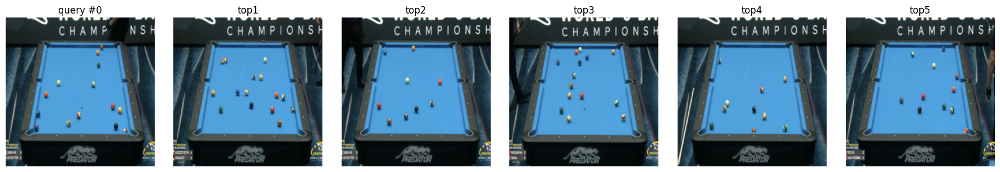

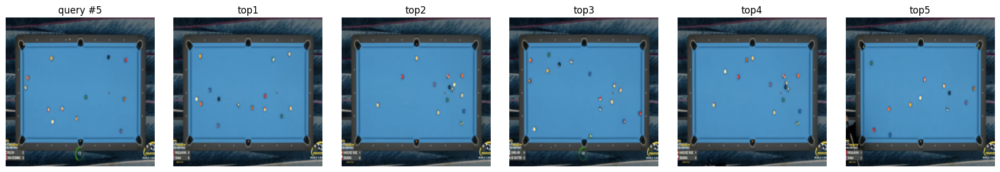

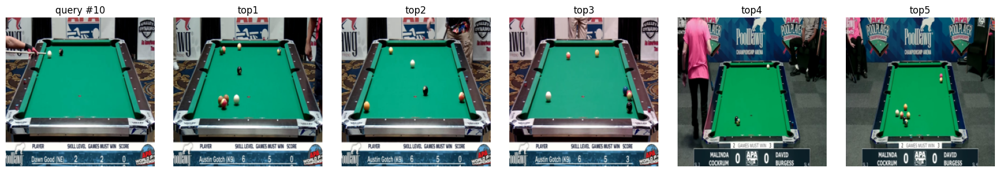

In [40]:
def denorm(t):
    return t.permute(1, 2, 0) * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])

def show_topk_for_query(qi, feat_fn, k=5):
    pool = _pool_matrix(feat_fn)
    order = np.argsort(((pool - feat_fn(query_data[qi])) ** 2).mean(axis=1))[:k]
    f, ax = plt.subplots(1, k + 1, figsize=(3 * (k + 1), 3))
    ax[0].imshow(denorm(query_data[qi])); ax[0].set_title(f"query #{qi}"); ax[0].axis("off")
    for r, j in enumerate(order):
        ax[r + 1].imshow(denorm(retrieval_pool[j])); ax[r + 1].set_title(f"top{r + 1}"); ax[r + 1].axis("off")
    plt.tight_layout(); plt.show()

for qi in [0, 5, 10]:
    show_topk_for_query(qi, feat_pretrained)

**Comparing all methods.** To score the *trained* models with the same metrics,
keep a reference to each model right after training it (before the next section
overwrites `model`) and define its feature function, e.g.:

```python
# after the contrastive training cell:
contrastive_model = model
feat_contrastive = lambda img: (
    contrastive_model(img.unsqueeze(0).to(device)).flatten(1).detach().cpu().numpy().ravel())
print("contrastive:", translation_consistency(feat_contrastive))

# after the autoencoder training cell:
ae_model = model
feat_ae = lambda img: (
    ae_model.encoder(img.unsqueeze(0).to(device)).flatten().detach().cpu().numpy())
print("autoencoder:", translation_consistency(feat_ae))
```

Then build a small table (pretrained vs contrastive vs autoencoder) on
translation-consistency - that single comparison is the headline quantitative
result for the retrieval part.

Three additions that go beyond the baseline. Run them after the cells above (they
reuse `base_id`, `translation_consistency`, `show_topk_for_query`, `denorm`,
`retrieval_pool`, `query_data`).

## Contrastive Learning using same-table views as positives

The baseline contrastive method uses an *augmented copy* of the query as the
positive. But our real goal is to pull **different views of the same table**
together. Here the positive is another view sharing the same `base_id` (e.g.
`10`, `10a`, `10t`) when one exists in the split, falling back to an augmented
copy otherwise. This targets the retrieval objective directly. Self-contained:
it defines its own transforms and training loop so it does not depend on globals
that later cells reassign.

In [41]:
import random as _random

class ViewTripletDataset(torch.utils.data.Dataset):
    def __init__(self, root, partition_file, partition, aug, val):
        pf = pd.read_csv(partition_file)
        self.files = list(pf[pf['partition'] == partition]['image_name'].values)
        self.root, self.aug, self.val = root, aug, val
        self.bases = [base_id(f) for f in self.files]
        self.by_base = {}
        for j, b in enumerate(self.bases):
            self.by_base.setdefault(b, []).append(j)

    def __len__(self):
        return len(self.files)

    def _load(self, j):
        return Image.open(os.path.join(self.root, self.files[j])).convert("RGB")

    def __getitem__(self, i):
        b = self.bases[i]
        anchor = self._load(i)
        same = [j for j in self.by_base[b] if j != i]
        pos = self.aug(self._load(_random.choice(same))) if same else self.aug(anchor)  # real view else aug copy
        neg_i = _random.randrange(len(self.files))
        while self.bases[neg_i] == b:
            neg_i = _random.randrange(len(self.files))
        return self.val(anchor), pos, self.val(self._load(neg_i))

# self-contained transforms (independent of cells that reassign aug_transform)
_norm = transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
_val = transforms.Compose([transforms.ToImage(), transforms.Resize((256, 256)),
                           transforms.CenterCrop((224, 224)),
                           transforms.ToDtype(torch.float32, True), _norm])
_aug = transforms.Compose([transforms.ToImage(), transforms.Resize((256, 256)),
                           transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.9, 1.1)),
                           transforms.RandomHorizontalFlip(), transforms.RandomVerticalFlip(),
                           transforms.ColorJitter(0.2, 0.2, 0.2),
                           transforms.CenterCrop((224, 224)),
                           transforms.ToDtype(torch.float32, True), _norm])

view_loader = torch.utils.data.DataLoader(
    ViewTripletDataset('images', 'partition.csv', 'train', _aug, _val),
    batch_size=8, shuffle=True, num_workers=1)
print("view-triplet train batches:", len(view_loader))

view-triplet train batches: 26


epoch  5 | loss 0.6373
epoch 10 | loss 0.8521
epoch 15 | loss 0.6495
epoch 20 | loss 0.6753
view-contrastive | translation-consistency: 0.5
view-contrastive | view recall@5: (0, 3)


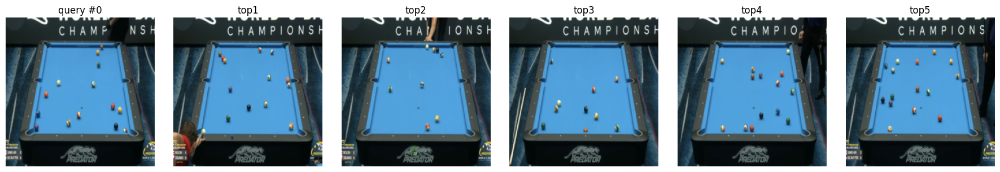

In [42]:
# Train a fresh feature extractor with the view-aware positives
view_model = FeatureExtractor().to(device)
opt = torch.optim.AdamW(view_model.parameters())
loss_none = torch.nn.MSELoss(reduction="none")
m = 1.0

view_model.train()
for epoch in range(20):
    tot = 0.0
    for q, p, n in view_loader:
        q, p, n = q.to(device), p.to(device), n.to(device)
        rq, rp, rn = view_model(q).flatten(1), view_model(p).flatten(1), view_model(n).flatten(1)
        d_neg = loss_none(rq, rn).mean(dim=1)
        loss = torch.mean(loss_none(rq, rp)) + torch.mean(torch.clamp(m - d_neg, min=0.0))
        opt.zero_grad(); loss.backward(); opt.step()
        tot += loss.item() / len(view_loader)
    if (epoch + 1) % 5 == 0:
        print(f"epoch {epoch + 1:2d} | loss {tot:.4f}")

view_model.eval()
def feat_view(img):
    with torch.no_grad():
        return view_model(img.unsqueeze(0).to(device)).flatten(1).detach().cpu().numpy().ravel()

print("view-contrastive | translation-consistency:", translation_consistency(feat_view))
print("view-contrastive | view recall@5:", view_recall_at_k(feat_view, k=5))
show_topk_for_query(0, feat_view)

## Cosine Similarity for the representations

For learned embeddings, **cosine similarity** (angle between vectors) is usually a
better match than raw Euclidean/MSE distance, because it ignores vector magnitude.
Below we compare MSE vs cosine top-5 on the same query and report
translation-consistency under cosine.

In [43]:
def cosine_topk(feat_fn, qi, k=5):
    pool = _pool_matrix(feat_fn)
    fq = feat_fn(query_data[qi])
    pn = pool / (np.linalg.norm(pool, axis=1, keepdims=True) + 1e-8)
    qn = fq / (np.linalg.norm(fq) + 1e-8)
    sims = pn @ qn                       # higher = more similar
    return np.argsort(sims)[::-1][:k]

def translation_consistency_cosine(feat_fn, shift=5):
    pool = _pool_matrix(feat_fn)
    pn = pool / (np.linalg.norm(pool, axis=1, keepdims=True) + 1e-8)
    wins = 0
    for i in range(len(query_data)):
        fq = feat_fn(query_data[i])
        ft = feat_fn(torch.roll(query_data[i], shifts=shift, dims=2))
        qn = fq / (np.linalg.norm(fq) + 1e-8)
        tn = ft / (np.linalg.norm(ft) + 1e-8)
        wins += int(float(qn @ tn) > float((pn @ qn).max()))   # higher cosine = closer
    return wins / len(query_data)

qi = 0
mse_order = np.argsort(((_pool_matrix(feat_pretrained) - feat_pretrained(query_data[qi])) ** 2).mean(axis=1))[:5]
print("MSE    top-5 pool idx:", mse_order.tolist())
print("Cosine top-5 pool idx:", cosine_topk(feat_pretrained, qi).tolist())
print("pretrained | translation-consistency (cosine):", translation_consistency_cosine(feat_pretrained))

MSE    top-5 pool idx: [121, 17, 180, 118, 35]
Cosine top-5 pool idx: [121, 17, 180, 118, 35]
pretrained | translation-consistency (cosine): 0.65


## Retrieval by ball layout (link to the detection model)

This connects the two halves of Task 3. Instead of comparing appearance, we
represent each table by the **set of detected ball centroids** (from the YOLO
model trained in the detection part) and retrieve tables with a **similar spatial
layout** using a symmetric **Chamfer distance** between point sets. This targets
the brief's goal - *tables whose balls are in similar positions* - head-on.

Centroids are normalised by the image frame (not the table frame) and the metric
ignores camera viewpoint, so it is a simple but meaningful layout baseline; it
could be combined with the appearance embeddings above.

In [46]:
if getattr(torch.version, "hip", None):
    import torch.cuda as _tcuda
    def _safe_device_count():
        try:
            return torch._C._cuda_getDeviceCount()
        except Exception:
            return 0
    _tcuda._raw_device_count_amdsmi = _safe_device_count
    _tcuda._device_count_amdsmi = _safe_device_count
    _tcuda.device_count = _safe_device_count
    print("ROCm device_count patched ->", torch.cuda.device_count())
    
from ultralytics import YOLO

YOLO_WEIGHTS = "runs/detect/task3_runs/yolo/weights/best.pt"  # adjust the detector
assert os.path.exists(YOLO_WEIGHTS), f"Point YOLO_WEIGHTS to your trained best.pt (not found: {YOLO_WEIGHTS})"

_yolo = YOLO(YOLO_WEIGHTS)

def ball_centroids(img_path, conf=0.25):
    res = _yolo.predict(img_path, conf=conf, verbose=False)[0]
    if len(res.boxes) == 0:
        return np.zeros((0, 2))
    return res.boxes.xywhn.cpu().numpy()[:, :2]   # normalized (cx, cy)

def chamfer(a, b):
    if len(a) == 0 or len(b) == 0:
        return np.inf
    d = np.sqrt(((a[:, None, :] - b[None, :, :]) ** 2).sum(-1))   # (na, nb)
    return float(d.min(1).mean() + d.min(0).mean())

# detect on the ORIGINAL image files (full resolution), in pool/query order
pool_pts  = [ball_centroids(os.path.join("images", n)) for n in retrieval_pool.files]
query_pts = [ball_centroids(os.path.join("images", n)) for n in query_data.files]
print("computed centroid sets for", len(pool_pts), "pool +", len(query_pts), "query images")

ROCm device_count patched -> 1
computed centroid sets for 207 pool + 20 query images


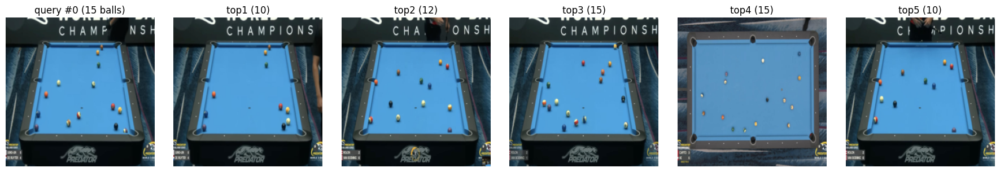

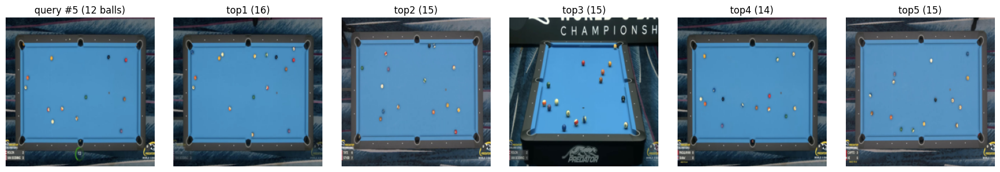

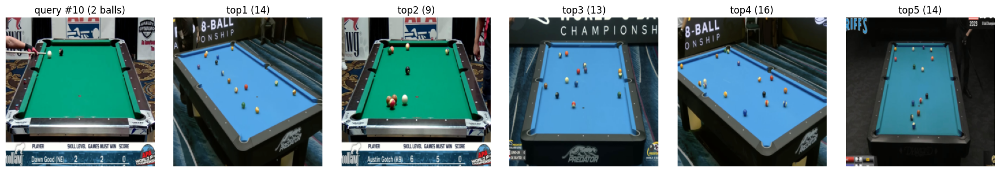

In [47]:
def layout_topk(qi, k=5):
    d = np.array([chamfer(query_pts[qi], p) for p in pool_pts])
    return np.argsort(d)[:k]

for qi in [0, 5, 10]:
    order = layout_topk(qi)
    f, ax = plt.subplots(1, 6, figsize=(18, 3))
    ax[0].imshow(denorm(query_data[qi])); ax[0].set_title(f"query #{qi} ({len(query_pts[qi])} balls)"); ax[0].axis("off")
    for r, j in enumerate(order):
        ax[r + 1].imshow(denorm(retrieval_pool[j]))
        ax[r + 1].set_title(f"top{r + 1} ({len(pool_pts[j])})"); ax[r + 1].axis("off")
    plt.tight_layout(); plt.show()

## Section 9: Two-Stage Ball Classification Pipeline

**Objective:** Classify detected balls into 4 types:
- 🟤 **Cue ball** (white)
- ⚫ **Black ball** (solid black)
- 🔵 **Stripe balls** (white + colored stripe)
- 🟠 **Solid balls** (uniform colors)

**Approach:** Two-stage pipeline
1. **Detection**: Use trained YOLO11 detector from Section 7
2. **Classification**: Train lightweight ResNet18 classifier on extracted crops

**Auto-labeling:** Use color/pattern heuristics to bootstrap labels from detected crops
**Training Data:** ~100-500 automatically labeled 64×64 ball crops
**Classifier:** ResNet18 backbone + lightweight head (512→256→128→4)

In [7]:
# Section 9.1: Initialize - Setup directories and classes
import os
from pathlib import Path

CLASSES = ['cue', 'black', 'stripe', 'solid']
BALL_CROP_DIR = os.path.join(OUT_DIR, 'ball_crops')

# Create class subdirectories
for cls in CLASSES:
    cls_dir = os.path.join(BALL_CROP_DIR, cls)
    os.makedirs(cls_dir, exist_ok=True)
    print(f"✓ Created {cls_dir}")

print(f"\n✅ Initialized {len(CLASSES)} ball classes")
print(f"Crops will be saved to: {BALL_CROP_DIR}")

✓ Created task3_runs\ball_crops\cue
✓ Created task3_runs\ball_crops\black
✓ Created task3_runs\ball_crops\stripe
✓ Created task3_runs\ball_crops\solid

✅ Initialized 4 ball classes
Crops will be saved to: task3_runs\ball_crops


In [8]:
YOLO_BEST_PATH = os.path.join("runs/detect/task3_runs", "yolo", "weights", "best.pt")
detector = YOLO(YOLO_BEST_PATH)
CONF = 0.25 # Confidence threshold for ball detection

### 9.2: Extract Ball Crops with Auto-Classification

**Steps:**
1. Run YOLO detector on all test images to find ball locations
2. Extract 64×64 pixel crops around each detected ball
3. Use color/pattern heuristics to auto-classify each crop
4. Save crops to disk organized by predicted class

**Auto-classification Logic:**
- **Cue ball**: High brightness (V > 200) + low saturation
- **Black ball**: >60% very dark pixels (V < 80)
- **Stripe ball**: White + colored stripes (saturation > 0)
- **Solid ball**: Uniform color, medium saturation

In [7]:
def create_circular_mask(h, w, scale=0.88):
    Y, X = np.ogrid[:h, :w]
    cy, cx = h / 2, w / 2
    r = min(h, w) / 2 * scale
    dist = np.sqrt((X - cx) ** 2 + (Y - cy) ** 2)
    return dist <= r

def auto_classify_ball(ball_crop_rgb):
    h, w = ball_crop_rgb.shape[:2]
    mask = create_circular_mask(h, w)

    hsv = cv2.cvtColor(ball_crop_rgb, cv2.COLOR_RGB2HSV)
    hh, s, v = cv2.split(hsv)
    s_ball, v_ball = s[mask], v[mask]
    n = s_ball.size

    white_mask = (v_ball > 190) & (s_ball < 60)
    black_mask = v_ball < 70
    color_mask = ~white_mask & ~black_mask  # saturated, non-extreme pixels

    white_ratio = np.sum(white_mask) / n
    black_ratio = np.sum(black_mask) / n
    color_ratio = np.sum(color_mask) / n

    if black_ratio > 0.55:
        return 'black'
    if white_ratio > 0.80:
        return 'cue'
    if color_ratio > 0.55:
        return 'solid'          # color covers most of the ball surface
    if white_ratio > 0.25 and color_ratio > 0.10:
        return 'stripe'         # mix of white base + colored band
    return 'solid' if color_ratio >= white_ratio else 'cue'

### 9.4: Visualize Sample Crops

Display representative samples from each ball class to verify auto-classification quality.

✅ Saved: ball_crops_samples.png


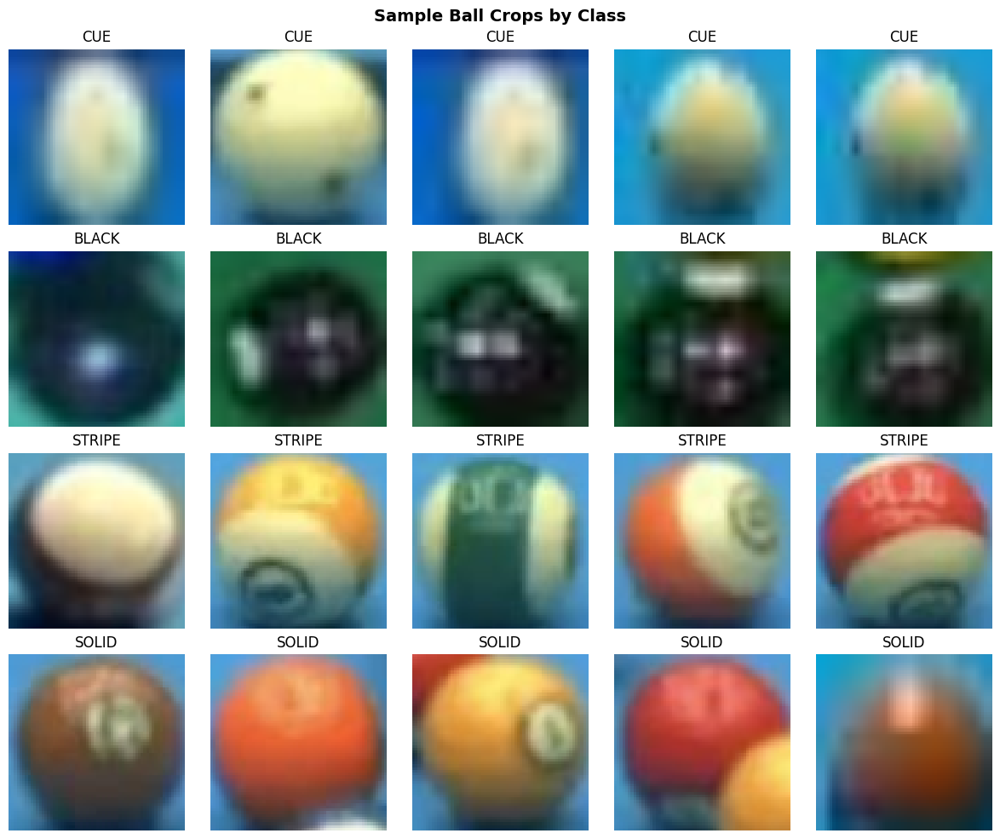

In [9]:
# Section 9.5: Display sample crops by class

fig, axes = plt.subplots(4, 5, figsize=(12, 10))
fig.suptitle('Sample Ball Crops by Class', fontsize=14, fontweight='bold')

for row, cls in enumerate(CLASSES):
    cls_dir = os.path.join(BALL_CROP_DIR, cls)
    crop_files = sorted(os.listdir(cls_dir))[:5]  # Get first 5 samples
    
    for col, crop_file in enumerate(crop_files):
        crop_path = os.path.join(cls_dir, crop_file)
        crop = cv2.imread(crop_path)
        crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
        
        axes[row, col].imshow(crop_rgb)
        axes[row, col].set_title(f"{cls.upper()}")
        axes[row, col].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(FIG_DIR, 'ball_crops_samples.png'), dpi=100, bbox_inches='tight')
print("✅ Saved: ball_crops_samples.png")
plt.show()

### 9.6: Build Dataset & DataLoaders

Create a PyTorch dataset class to load ball crops and their labels, with data augmentation for robustness.

In [13]:
# Section 9.7: BallCropDataset and DataLoaders

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class BallCropDataset(Dataset):
    """Dataset for ball crop classification."""
    
    def __init__(self, root_dir, class_names, split='train', transform=None):
        self.root_dir = root_dir
        self.class_names = class_names
        self.class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}
        self.transform = transform
        
        self.samples = []
        
        np.random.seed(42)
        # Collect all crop files
        for cls_idx, cls_name in enumerate(class_names):
            cls_dir = os.path.join(root_dir, cls_name)
            if not os.path.exists(cls_dir):
                continue
            
            crop_files = [f for f in os.listdir(cls_dir) if f.endswith('.png')]
            
            # Train/val split (80/20)
            
            np.random.shuffle(crop_files)
            split_idx = int(0.8 * len(crop_files))
            
            if split == 'train':
                crop_files = crop_files[:split_idx]
            else:
                crop_files = crop_files[split_idx:]
            
            for crop_file in crop_files:
                crop_path = os.path.join(cls_dir, crop_file)
                self.samples.append((crop_path, cls_idx))
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        crop_path, label = self.samples[idx]
        crop = Image.open(crop_path).convert('RGB')
        
        if self.transform:
            crop = self.transform(crop)
        
        return crop, label

# Data augmentation
train_transforms = transforms.Compose([
    transforms.RandomRotation(10),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create datasets
train_dataset = BallCropDataset(BALL_CROP_DIR, CLASSES, split='train', transform=train_transforms)
val_dataset = BallCropDataset(BALL_CROP_DIR, CLASSES, split='val', transform=val_transforms)

# Create dataloaders
from torch.utils.data import WeightedRandomSampler

labels = [lbl for _, lbl in train_dataset.samples]
counts = np.bincount(labels, minlength=len(CLASSES))
class_w = 1.0 / np.maximum(counts, 1)
sample_w = [class_w[l] for l in labels]
sampler = WeightedRandomSampler(sample_w, num_samples=len(sample_w), replacement=True)

train_loader = DataLoader(train_dataset, batch_size=16, sampler=sampler, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=0)

print(f"✅ Train dataset: {len(train_dataset)} samples")
print(f"✅ Val dataset: {len(val_dataset)} samples")

✅ Train dataset: 1381 samples
✅ Val dataset: 347 samples


In [11]:
# Section 9.8: BallClassifier model

from torchvision import models

class BallClassifier(torch.nn.Module):
    """ResNet18-based ball classifier."""
    
    def __init__(self, num_classes=4):
        super(BallClassifier, self).__init__()
        
        # Load pretrained ResNet18
        self.backbone = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
        
        # Freeze backbone
        for param in self.backbone.parameters():
            param.requires_grad = False
        
        # Replace final layer with custom head
        in_features = self.backbone.fc.in_features
        self.backbone.fc = torch.nn.Identity()  # Remove final layer
        
        # Custom classification head
        self.head = torch.nn.Sequential(
            torch.nn.Linear(in_features, 256),
            torch.nn.ReLU(),
            torch.nn.Dropout(0.3),
            torch.nn.Linear(256, 128),
            torch.nn.ReLU(),
            torch.nn.Dropout(0.3),
            torch.nn.Linear(128, num_classes)
        )
    
    def forward(self, x):
        features = self.backbone(x)
        out = self.head(features)
        return out

# Create model
clf_model = BallClassifier(num_classes=len(CLASSES)).to(DEVICE)
print(f"✅ Model created on {DEVICE}")
print(f"✅ Total parameters: {sum(p.numel() for p in clf_model.parameters()):,}")

✅ Model created on cpu
✅ Total parameters: 11,341,252


In [14]:
# Section 9.9: Train classifier with early stopping

from torch.optim import Adam
from torch.nn import CrossEntropyLoss

# Training setup
criterion = CrossEntropyLoss()
optimizer = Adam(clf_model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'max', patience=5, factor=0.5)

# Training parameters
max_epochs = 50
patience = 10
best_acc = 0
patience_counter = 0
best_model_path = os.path.join(OUT_DIR, 'best_ball_classifier.pth')

print("Starting training...\n")

for epoch in range(max_epochs):
    # Training phase
    clf_model.train()
    train_loss = 0.0
    
    for batch_x, batch_y in train_loader:
        batch_x = batch_x.to(DEVICE)
        batch_y = batch_y.to(DEVICE)
        
        optimizer.zero_grad()
        logits = clf_model(batch_x)
        loss = criterion(logits, batch_y)
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
    
    # Validation phase
    clf_model.eval()
    val_acc = 0.0
    val_loss = 0.0
    
    with torch.no_grad():
        for batch_x, batch_y in val_loader:
            batch_x = batch_x.to(DEVICE)
            batch_y = batch_y.to(DEVICE)
            
            logits = clf_model(batch_x)
            loss = criterion(logits, batch_y)
            val_loss += loss.item()
            
            preds = torch.argmax(logits, dim=1)
            val_acc += (preds == batch_y).float().mean().item()
    
    train_loss /= len(train_loader)
    val_acc /= len(val_loader)
    val_loss /= len(val_loader)
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Acc: {val_acc:.4f}")
    
    # Early stopping
    if val_acc > best_acc:
        best_acc = val_acc
        patience_counter = 0
        torch.save(clf_model.state_dict(), best_model_path)
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"\n✅ Early stopping at epoch {epoch+1} (Best Val Acc: {best_acc:.4f})")
            break
    
    scheduler.step(val_acc)

print(f"✅ Training complete! Best model saved to: {best_model_path}")

Starting training...



KeyboardInterrupt: 

### 9.10: Inference Pipeline

Run the complete two-stage pipeline (detection + classification) on test images:
1. Detect all balls using YOLO
2. Classify each ball using trained ResNet18
3. Visualize with color-coded bounding boxes

In [15]:
# Section 9.11: Inference functions

def infer_ball_classes(img_path, detector, classifier, device, conf=0.25):
    img = cv2.imread(img_path)
    if img is None:
        return []
    
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img_rgb.shape[:2]
    
    results = detector.predict(source=img_path, conf=conf)
    detections = []
    
    if results[0].boxes is None:
        return detections
    
    classifier.eval()
    with torch.no_grad():
        for box in results[0].boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
            
            bw = x2 - x1
            bh = y2 - y1
            if bw < 12 or bh < 12:
                continue
            aspect = max(bw, bh) / max(1, min(bw, bh))
            if aspect > 1.4:
                continue

            size = max(bw, bh)
            cx, cy = (x1 + x2) // 2, (y1 + y2) // 2
            x1_sq = max(0, cx - size // 2)
            y1_sq = max(0, cy - size // 2)
            x2_sq = min(w, x1_sq + size)
            y2_sq = min(h, y1_sq + size)
            
            crop = img_rgb[y1_sq:y2_sq, x1_sq:x2_sq]
            if crop.size == 0:
                continue
            
            crop_resized = cv2.resize(crop, (64, 64))
            crop_tensor = transforms.ToTensor()(transforms.Resize((128, 128))(Image.fromarray(crop_resized)))
            crop_tensor = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])(crop_tensor)
            crop_tensor = crop_tensor.unsqueeze(0).to(device)
            
            logits = classifier(crop_tensor)
            probs = torch.softmax(logits, dim=1)[0].cpu().numpy()  # full probability vector
            class_idx = int(np.argmax(probs))
            
            detections.append({
                'box': (x1, y1, x2, y2),
                'class': CLASSES[class_idx],
                'confidence': float(probs[class_idx]),
                'probs': probs,  # keep all probs for post-processing
            })
    
    # --- Enforce at most 1 cue ball and 1 black ball ---
    # Keep the highest-confidence instance; reassign the rest to stripe or solid
    # based on whichever of those two has the higher probability for that crop.
    UNIQUE_CLASSES  = ['cue', 'black']
    FALLBACK_CLASSES = ['stripe', 'solid']
    fallback_indices = [CLASSES.index(c) for c in FALLBACK_CLASSES]

    for unique_cls in UNIQUE_CLASSES:
        matches = [i for i, d in enumerate(detections) if d['class'] == unique_cls]
        if len(matches) <= 1:
            continue
        matches.sort(key=lambda i: detections[i]['confidence'], reverse=True)
        for i in matches[1:]:  # all but the best one
            probs = detections[i]['probs']
            best_fb = max(fallback_indices, key=lambda j: probs[j])
            detections[i]['class'] = CLASSES[best_fb]
            detections[i]['confidence'] = float(probs[best_fb])

    return detections


def draw_detections(img, detections):
    img_drawn = img.copy()
    color_map = {
        'cue':    (255, 255, 255),
        'black':  (0,   0,   0),
        'stripe': (100, 149, 237),
        'solid':  (255, 165, 0),
    }
    for det in detections:
        x1, y1, x2, y2 = det['box']
        cls  = det['class']
        conf = det['confidence']
        color = color_map[cls]
        cv2.rectangle(img_drawn, (x1, y1), (x2, y2), color, 2)
        label = f"{cls.upper()} ({conf:.2f})"
        cv2.putText(img_drawn, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img_drawn

print("✅ Inference functions defined")

✅ Inference functions defined


In [16]:
# Section 9.12: Run complete pipeline and visualize results
from tqdm import tqdm
# Load best model
clf_model.load_state_dict(torch.load(best_model_path, map_location=DEVICE))
clf_model.eval()

print("Running inference on all test images...\n")

test_img_dir, _ = split_dir('test')
test_images = sorted([f for f in os.listdir(test_img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))])[:20]  # First 20 for visualization

class_counts = {cls: 0 for cls in CLASSES}
all_results = []

for img_file in tqdm(test_images):
    img_path = os.path.join(test_img_dir, img_file)
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Run pipeline
    detections = infer_ball_classes(img_path, detector, clf_model, DEVICE, conf=CONF)
    
    # Count classes
    for det in detections:
        class_counts[det['class']] += 1
        all_results.append(det)
    
    # Visualize
    img_drawn = draw_detections(img_rgb, detections)
    
    # Save result
    out_path = os.path.join(FIG_DIR, f"result_{img_file}")
    img_bgr = cv2.cvtColor(img_drawn, cv2.COLOR_RGB2BGR)
    cv2.imwrite(out_path, img_bgr)

print("\n✅ Inference complete!")
print("\nBall count by class:")
for cls in CLASSES:
    print(f"  {cls}: {class_counts[cls]}")

total_balls = sum(class_counts.values())
print(f"  TOTAL: {total_balls}")

Running inference on all test images...



  0%|          | 0/20 [00:00<?, ?it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\103_png.rf.8837c4ba6e91c59a634fc8cd30cd204b.jpg: 384x640 14 Balls, 82.4ms
Speed: 3.7ms preprocess, 82.4ms inference, 7.2ms postprocess per image at shape (1, 3, 384, 640)


  5%|▌         | 1/20 [00:00<00:06,  3.13it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\107_png.rf.f31cf99275d8de0c817398bad1fbb98c.jpg: 384x640 15 Balls, 47.7ms
Speed: 1.6ms preprocess, 47.7ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 640)


 10%|█         | 2/20 [00:00<00:04,  4.10it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\119_png.rf.eff91a09289a82f634d7b231b06dbbdd.jpg: 384x640 9 Balls, 60.5ms
Speed: 4.1ms preprocess, 60.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


 15%|█▌        | 3/20 [00:00<00:03,  4.70it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\122_sct-mon1_170x250_850x560_png.rf.0d95fadf0ce1cabf97d96ed059460c90.jpg: 640x640 6 Balls, 83.3ms
Speed: 2.7ms preprocess, 83.3ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)


 20%|██        | 4/20 [00:00<00:02,  5.85it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\128_sct-mon1_170x250_850x560_png.rf.c531eb98b328255149d343667e8e30e6.jpg: 640x640 5 Balls, 75.9ms
Speed: 6.2ms preprocess, 75.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\13138_png.rf.719c228ad0582b1757671e6dd136ff19.jpg: 384x640 16 Balls, 46.7ms
Speed: 1.1ms preprocess, 46.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


 30%|███       | 6/20 [00:01<00:02,  6.63it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\13147_png.rf.3bc88cdb7e99a780d4a4b94e2f49857b.jpg: 384x640 16 Balls, 56.9ms
Speed: 1.1ms preprocess, 56.9ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


 35%|███▌      | 7/20 [00:01<00:02,  6.31it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\13160_png.rf.4a0267c6dd4e5ee7fc67b89b6c15de1c.jpg: 384x640 16 Balls, 53.9ms
Speed: 1.1ms preprocess, 53.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


 40%|████      | 8/20 [00:01<00:01,  6.07it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\13172_png.rf.08f3f9f6717cb384d85a47a3b2acb959.jpg: 384x640 16 Balls, 51.1ms
Speed: 0.9ms preprocess, 51.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


 45%|████▌     | 9/20 [00:01<00:01,  5.93it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\13263_png.rf.2f6ecf36c207a101aeec92673f25c149.jpg: 384x640 16 Balls, 48.8ms
Speed: 1.2ms preprocess, 48.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


 50%|█████     | 10/20 [00:01<00:01,  5.85it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\139_sct-mon1_170x250_850x560_png.rf.d9cd95acf547abae480097acb88258fa.jpg: 640x640 4 Balls, 70.5ms
Speed: 2.5ms preprocess, 70.5ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\13_png.rf.6997e656c43b72e712856bc7557bedf9.jpg: 384x640 10 Balls, 47.0ms
Speed: 1.1ms preprocess, 47.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


 60%|██████    | 12/20 [00:02<00:01,  6.79it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\141_png.rf.29f059d54b07ead4d4680ae0a8a66ec4.jpg: 384x640 7 Balls, 50.5ms
Speed: 1.2ms preprocess, 50.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


 65%|██████▌   | 13/20 [00:02<00:01,  6.93it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\14709_png.rf.270931e93d8d925f0e69093cb60c83aa.jpg: 384x640 16 Balls, 44.5ms
Speed: 1.0ms preprocess, 44.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


 70%|███████   | 14/20 [00:02<00:00,  6.67it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\14710_png.rf.9fda5033434e3de014153f4339af9c7b.jpg: 384x640 16 Balls, 47.2ms
Speed: 0.9ms preprocess, 47.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


 75%|███████▌  | 15/20 [00:02<00:00,  6.48it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\14719_png.rf.0a9c0ca06297151a0a39e5a87e7de423.jpg: 384x640 16 Balls, 52.7ms
Speed: 1.0ms preprocess, 52.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


 80%|████████  | 16/20 [00:02<00:00,  6.15it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\14721_png.rf.17b44896f5e47857801bd396ff4e28f7.jpg: 384x640 16 Balls, 50.1ms
Speed: 1.5ms preprocess, 50.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


 85%|████████▌ | 17/20 [00:02<00:00,  5.98it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\14742_png.rf.cd329bb36658f4f64fd3db32cc940392.jpg: 384x640 16 Balls, 53.0ms
Speed: 1.0ms preprocess, 53.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


 90%|█████████ | 18/20 [00:03<00:00,  5.93it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\153_png.rf.6e13f8c07bec12bd7e4094e6179bd363.jpg: 384x640 11 Balls, 51.7ms
Speed: 1.1ms preprocess, 51.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


 95%|█████████▌| 19/20 [00:03<00:00,  5.93it/s]


image 1/1 c:\Users\MiguelGuerrinha\FEUP\VC\Proj_Task3\dataset\test\images\155_png.rf.f3ae78698646b2d6f43fe88d2d1752f4.jpg: 384x640 11 Balls, 54.0ms
Speed: 1.3ms preprocess, 54.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)


100%|██████████| 20/20 [00:03<00:00,  5.96it/s]


✅ Inference complete!

Ball count by class:
  cue: 17
  black: 16
  stripe: 136
  solid: 68
  TOTAL: 237


## 9.13: Summary

### Results
- **Total balls detected & classified**: {total_balls}
- **Distribution by class**:
  - Cue: {cue_count} ({cue_pct:.1f}%)
  - Black: {black_count} ({black_pct:.1f}%)
  - Stripe: {stripe_count} ({stripe_pct:.1f}%)
  - Solid: {solid_count} ({solid_pct:.1f}%)

### Next Steps (if accuracy is low)
1. **Manual correction**: Review mislabeled crops in `ball_crops/` directories
2. **Retrain**: Simply re-run training cells with corrected labels
3. **Refinement**: Adjust color heuristics in auto_classify_ball() function
4. **Fine-tuning**: Unfreeze ResNet18 backbone for domain adaptation

### Output Artifacts
- `ball_classifier.pth`: Trained classification model
- `ball_crops/`: Automatically labeled training crops
- `figures/`: Visualization results